<a href="https://colab.research.google.com/github/JosTheBossX/NLP-/blob/main/Emotion_Recognition_GOEmotions.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Installing Libraries and Dependencies

In [ ]:
!pip install datasets
!pip install emot
!pip install pyspellchecker

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import datasets
from datasets import load_dataset
import pandas as pd
import matplotlib.pyplot as plt
import emot
from emot.emo_unicode import UNICODE_EMOJI, EMOTICONS_EMO
import re
from collections import Counter
import random
import spacy
import nltk
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
from gensim.models import Word2Vec
import matplotlib
import seaborn as sns
import plotly.graph_objs as go
import plotly.offline as pyo
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.svm import SVC
import numpy as np
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from tensorflow.keras.utils import to_categorical
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Bidirectional, Dropout, Reshape
from tensorflow.keras import regularizers
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder
from scipy.sparse import csr_matrix
from keras.initializers import Constant
from keras.optimizers import Adam, Adagrad
from keras.callbacks import EarlyStopping

nlp = spacy.load('en_core_web_sm')
nltk.download('punkt') 
np.random.seed(42)
tf.random.set_seed(42)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
grp_labels = ['gratitude','sadness','pride','surprise','approval','neutral','realization','love','disapproval','desire','fear',
               'joy','confusion','optimism']
emotions = ['gratitude','sadness','pride','surprise','approval','neutral','realization','love','disapproval','desire','fear',
               'joy','confusion','optimism']
label_dict = {0: 'admiration', 1: 'amusement', 2: 'anger', 3: 'annoyance', 4: 'approval', 
              5: 'caring', 6: 'confusion', 7: 'curiosity', 8: 'desire', 9: 'disappointment', 
              10: 'disapproval', 11: 'disgust', 12: 'embarrassment', 13: 'excitement', 
              14: 'fear', 15: 'gratitude', 16: 'grief', 17: 'joy', 18: 'love', 
              19: 'nervousness', 20: 'optimism', 21: 'pride', 22: 'realization', 
              23: 'relief', 24: 'remorse', 25: 'sadness', 26: 'surprise', 27: 'neutral'}
grp_labels_dict = {0: 'gratitude', 1: 'sadness', 2: 'pride', 3: 'surprise', 4:'approval',5:'neutral',6:'realization',7:'love',
              8:'disapproval',9:'desire',10:'fear',11:'joy',12:'confusion',13:'optimism'}
label_hierarchy = {
      0: 15,
      1: 16,
      2: 17,
      3: 18,
      4: 13,
      5: 19,
      6: 7,
      7: 20,
      8: 3,
      9: 21,
      10: 10,
      11: 22,
      12:23 ,
      13: 24,
      14: 2 ,
      15:12 ,
      16: 25,
      17:8 ,
      18:11 ,
      19: 26,
      20: 9,
      21: 1 ,
      22: 5,
      23: 27,
      24: 28,
      25: 6,
      26:4,
      27: 14
  }

# 1. IMPORTING DATA

In [ ]:
dataset = load_dataset("go_emotions", "simplified")
train_data = pd.DataFrame(dataset['train'])
validation_data = pd.DataFrame(dataset['validation'])
test_data = pd.DataFrame(dataset['test'])
print('Length of training data: ',len(train_data))
print('Length of validation data: ',len(validation_data))
print('Length of test data: ',len(test_data))
train_data = train_data.drop(columns=['id']) # Remove the id column
validation_data = validation_data.drop(columns=['id'])
test_data = test_data.drop(columns=['id'])
train_data

  0%|          | 0/3 [00:00<?, ?it/s]

Length of training data:  43410
Length of validation data:  5426
Length of test data:  5427


,text,labels
0,My favourite food is anything I didn't have to...,[27]
1,"Now if he does off himself, everyone will thin...",[27]
2,WHY THE FUCK IS BAYLESS ISOING,[2]
3,To make her feel threatened,[14]
4,Dirty Southern Wankers,[3]
...,...,...
43405,Added you mate well I’ve just got the bow and ...,[18]
43406,Always thought that was funny but is it a refe...,[6]
43407,What are you talking about? Anything bad that ...,[3]
43408,"More like a baptism, with sexy results!",[13]


# Visualization of Data

In [ ]:
visualize = train_data.copy()
visualize['labels'] = [int(label[0]) for label in visualize['labels']]
visualize['description'] = visualize['labels'].map(label_dict )
visualize.head(5)

,text,labels,description
0,My favourite food is anything I didn't have to...,27,neutral
1,"Now if he does off himself, everyone will thin...",27,neutral
2,WHY THE FUCK IS BAYLESS ISOING,2,anger
3,To make her feel threatened,14,fear
4,Dirty Southern Wankers,3,annoyance


In [ ]:
grouped = visualize['labels'].apply(lambda x: label_dict[x]).value_counts()
data = [go.Bar(x=grouped.index, y=grouped.values)]
layout = go.Layout(title='GoEmotions Simplified Dataset', xaxis=dict(title='Labels'), yaxis=dict(title='Number of Samples'))
fig = go.Figure(data=data, layout=layout)
pyo.iplot(fig)

In [ ]:
visualize['labels'] = visualize['labels'].apply(lambda x: [x])

## Selecting 14 labels

In [ ]:
visualize["class_label"] = ""

# Iterate through each instance in the dataframe and assign the class label based on the hierarchy
for i, row in visualize.iterrows():
    labels = row["labels"]  # Extract the labels assigned to the instance as a list of integers
    highest_rank = float("inf")  # Initialize the highest rank to infinity
    
    # Iterate through each label and determine its rank based on the hierarchy
    for label in labels:
        rank = label_hierarchy[label]
        if rank < highest_rank:
            highest_rank = rank  # Update the highest rank if the label has a higher rank than the current highest rank
    
    # Assign the corresponding class label based on the highest ranking label
    for label, rank in label_hierarchy.items():
        if rank == highest_rank:
            visualize.at[i, "class_label"] = label
            break  # Break the loop once the corresponding label has been assigned to the instance
visualize["label"] = visualize["class_label"].apply(lambda x: [x])
visualize = visualize.drop(columns='class_label')
visualize = visualize.drop(columns='labels')
visualize['label'] = [int(label[0]) for label in visualize['label']]

In [ ]:
grouped = visualize['label'].apply(lambda x: label_dict[x]).value_counts()
data = [go.Bar(x=grouped.index, y=grouped.values)]
layout = go.Layout(title='Selected Labels', xaxis=dict(title='Labels'), yaxis=dict(title='No of Samples'))
fig = go.Figure(data=data, layout=layout)
pyo.iplot(fig)
visualize['label'] = visualize['label'].apply(lambda x: [x])

Now we have to make the labels from 0-13 and remove unwanted labels

In [ ]:
def remove_labels(df):
  # This maps the labels to the label_dict at the start of this notebook
  #and then makes a new column out of it
  df['string_labels'] = df['label'].apply(lambda x: [label_dict[label] for label in x])
  # This takes the label_dict and keeps only the rows in the grp_labels
  df_filtered = df[df['label'].apply(lambda x: any(label_dict[item] in grp_labels for item in x))]
  df_filtered = df_filtered.reset_index(drop=True)
  return df_filtered
def order_grp_labels(df):
  label_dict = {label: index for index, label in enumerate(grp_labels)}
  def convert_labels(labels):
      return [label_dict[label] for label in labels]

  df["label"] = df["string_labels"].apply(convert_labels)
  df = df.reset_index(drop=True).drop(columns='string_labels')
  return df

In [ ]:
visualize=remove_labels(visualize)

In [ ]:
visualize=order_grp_labels(visualize)

In [ ]:
visualize['label'] = [int(label[0]) for label in visualize['label']]
grouped = visualize['label'].apply(lambda x: grp_labels_dict[x]).value_counts()
data = [go.Bar(x=grouped.index, y=grouped.values)]
layout = go.Layout(title='Reduced Labels', xaxis=dict(title='Labels'), yaxis=dict(title='Samples'))
fig = go.Figure(data=data, layout=layout)
pyo.iplot(fig)
visualize['label'] = visualize['label'].apply(lambda x: [x])

In [ ]:
print('Distribution of the labels is:--')
visualize['description'].value_counts(normalize=True)

Distribution of the labels is:--


neutral        0.468215
approval       0.094789
gratitude      0.076533
disapproval    0.060284
love           0.055975
confusion      0.046299
joy            0.036988
optimism       0.035564
sadness        0.031913
surprise       0.027422
realization    0.025487
desire         0.019827
fear           0.018622
pride          0.002081
Name: description, dtype: float64

## Words per text

In [ ]:
visualize['text_length'] = visualize['text'].astype(str).apply(len)
visualize['text_word_count'] = visualize['text'].apply(lambda x: len(str(x).split()))

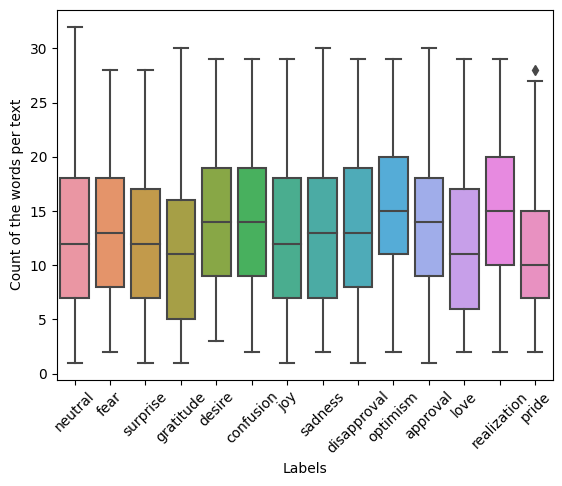

In [ ]:
sns.boxplot(x="description", y="text_word_count", data=visualize)
plt.xlabel('Labels');
plt.xticks(rotation=45)
plt.ylabel('Count of the words per text');

## Length of text VS number of samples

<ipython-input-17-21b564922db0>:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




The no of samples consisting of text length:-


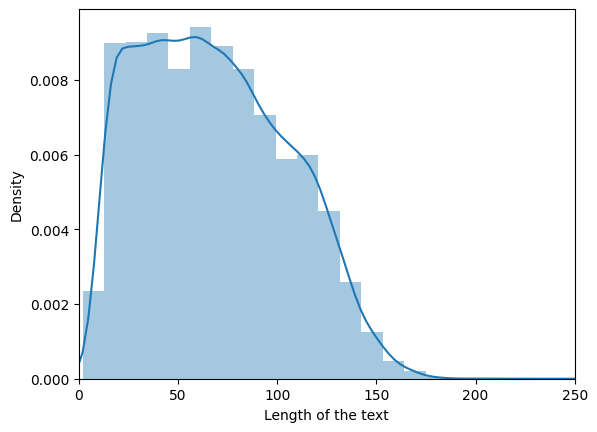

In [ ]:
sns.distplot(visualize['text_length'])
plt.xlim([0, 250]);
plt.xlabel('Length of the text');
print('The no of samples consisting of text length:-')

## Display N-Grams

In [ ]:
visualize['label'] = [int(label[0]) for label in visualize['label']]
emotion_df={}
for label, emotion in grp_labels_dict.items():
    emotion_df[emotion] = visualize[visualize['label'] == label]['text']

In [ ]:
gratitude = emotion_df['gratitude']
sadness = emotion_df['sadness']
pride = emotion_df['pride']
surprise = emotion_df['surprise']
approval = emotion_df['approval']
neutral = emotion_df['neutral']
realization = emotion_df['realization']
love = emotion_df['love']
disapproval = emotion_df['disapproval']
desire = emotion_df['desire']
fear = emotion_df['fear']
joy = emotion_df['joy']
confusion = emotion_df['confusion']
optimism = emotion_df['optimism']

Function to get top n_grams

In [ ]:
def get_top_n_gram(corpus,ngram_range,n=None):
    vec = CountVectorizer(ngram_range=ngram_range,stop_words = 'english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

Function to display the ngrams in a label

In [ ]:
def plot_ngram(dataframe, emotion):
  df = dataframe.copy()
  fig, axes = plt.subplots(1, 3, figsize=(15, 6), sharey=True)
  fig.suptitle('Emotion : {}'.format(emotion))
  unigrams = get_top_n_gram(df[emotion].values,(1,1),7)[2:]
  bigrams = get_top_n_gram(df[emotion].values,(2,2),7)[2:]
  trigrams = get_top_n_gram(df[emotion].values,(3,3),7)[2:]

  sns.barplot( x=list(dict(unigrams).keys()), y=list(dict(unigrams).values()),ax=axes[0],)
  axes[0].set_title('Unigrams')
  axes[0].tick_params(labelrotation=45)



  sns.barplot( x=list(dict(bigrams).keys()), y=list(dict(bigrams).values()),ax=axes[1],)
  axes[1].set_title('Bigrams')
  axes[1].tick_params(labelrotation=45)



  sns.barplot( x=list(dict(trigrams).keys()), y=list(dict(trigrams).values()),ax=axes[2],)
  axes[2].set_title('Trigrams')
  axes[2].tick_params(labelrotation=45)


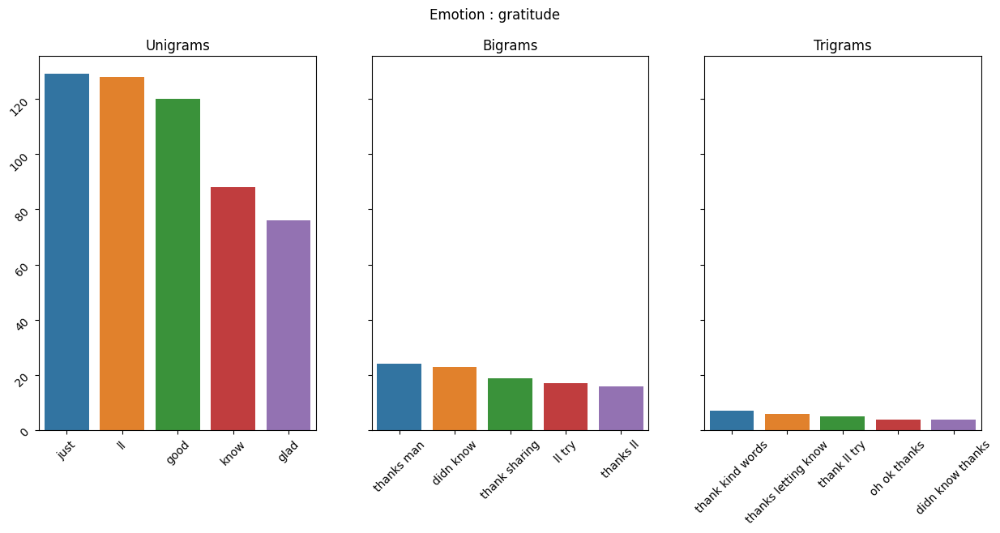

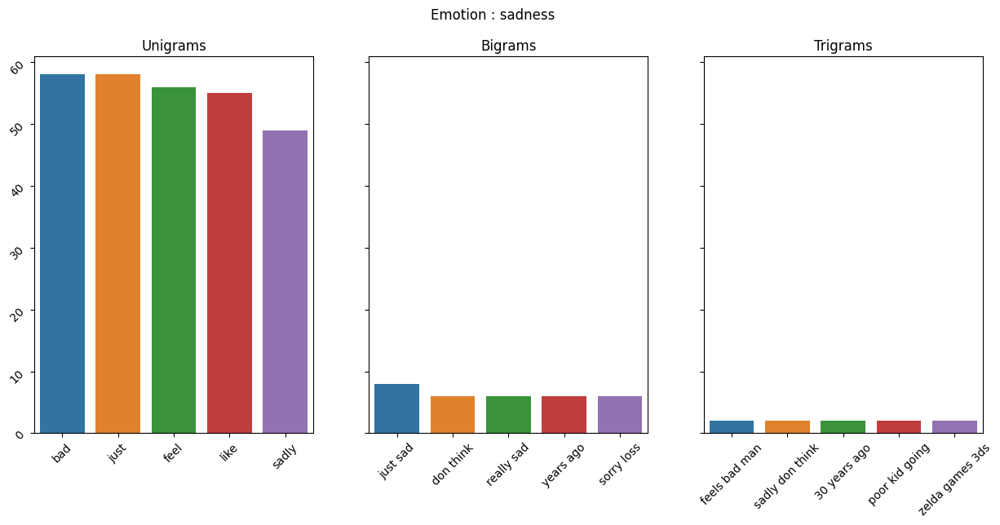

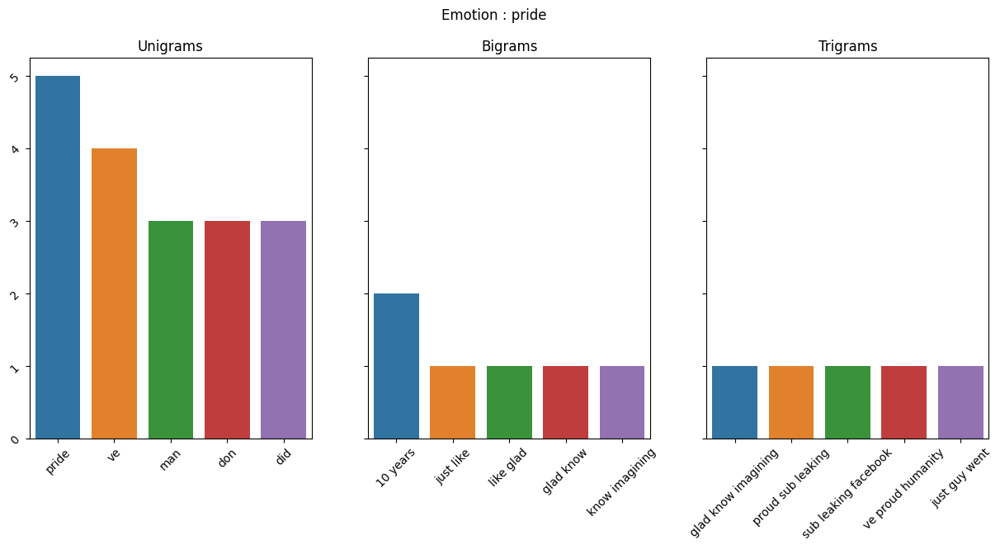

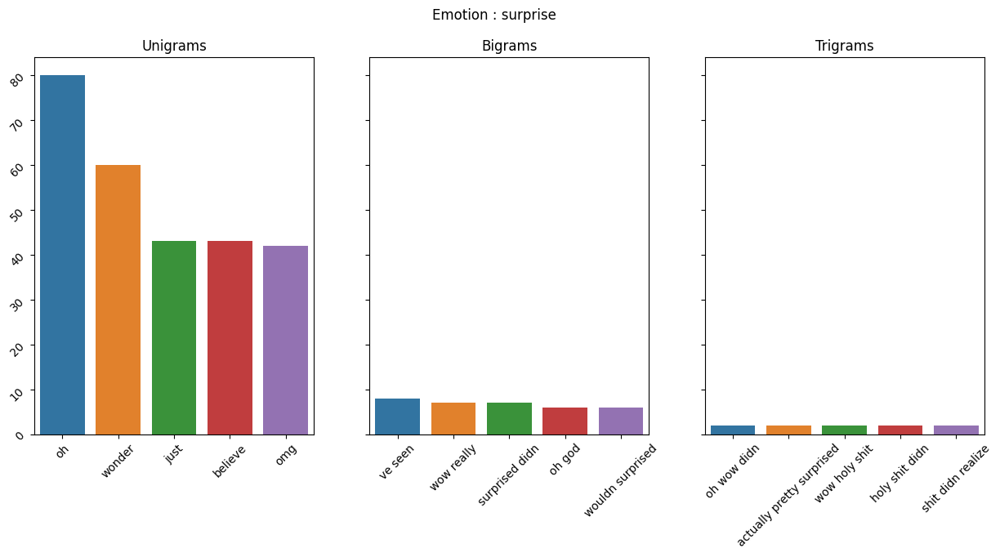

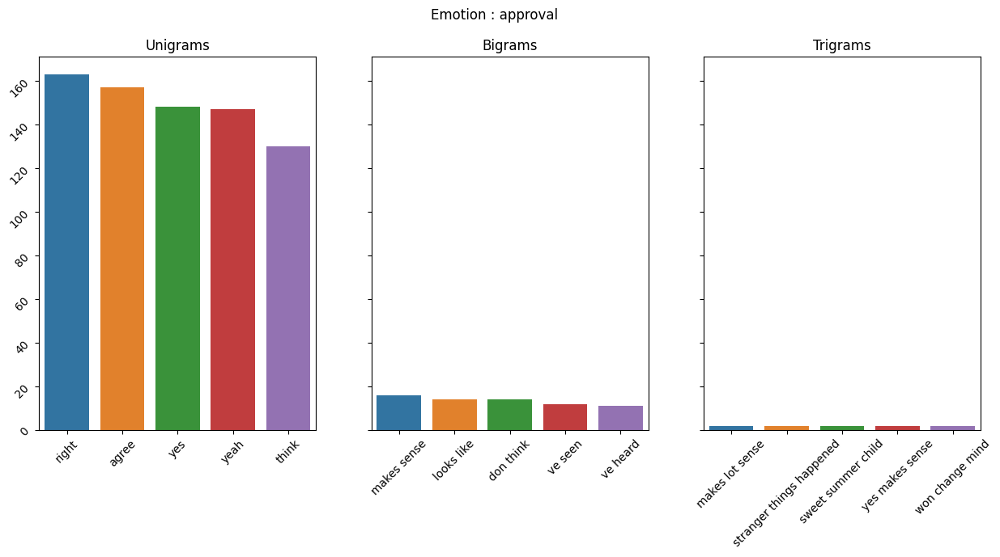

...

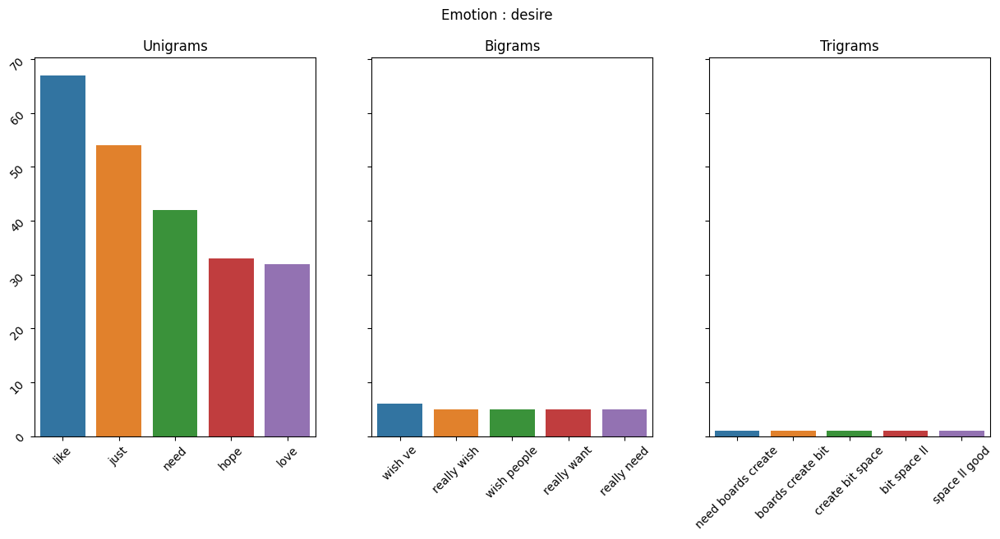

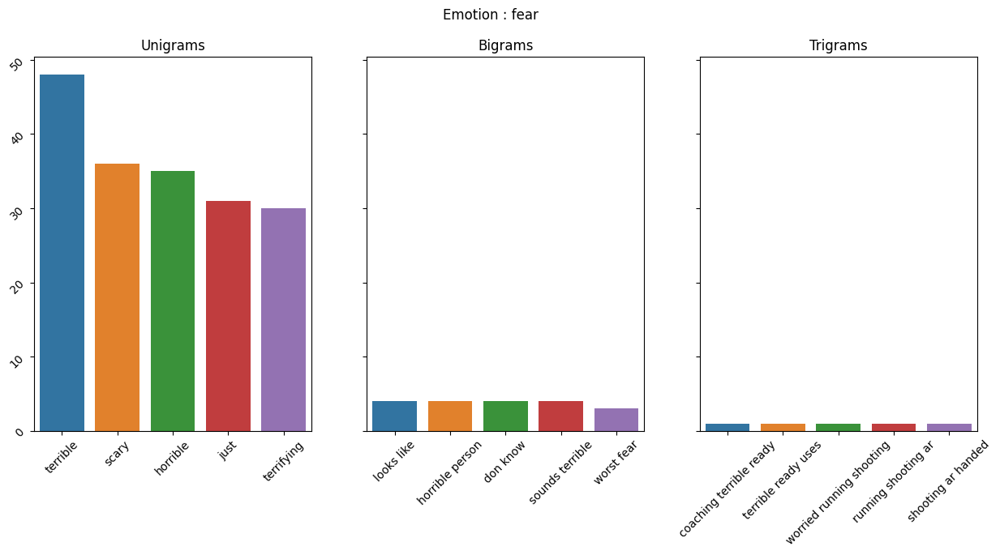

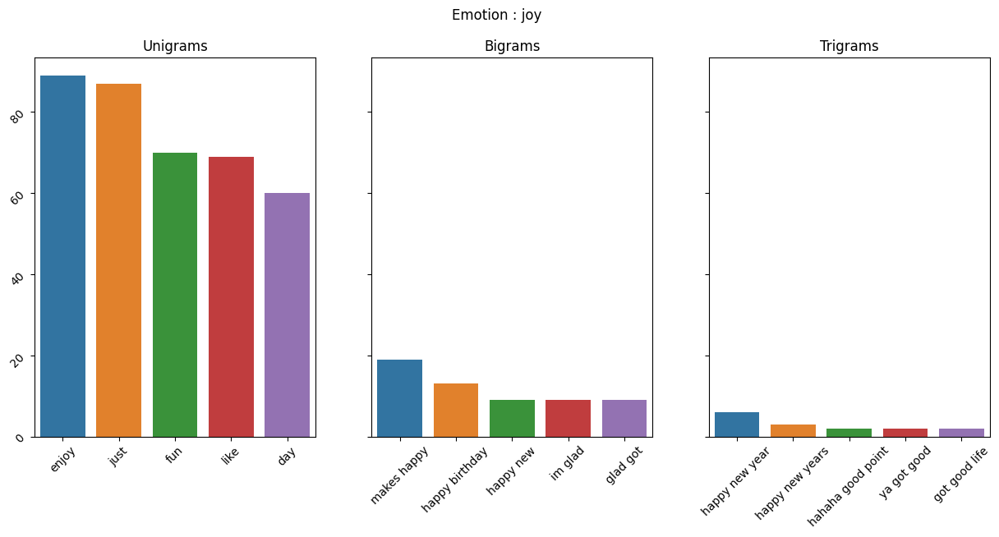

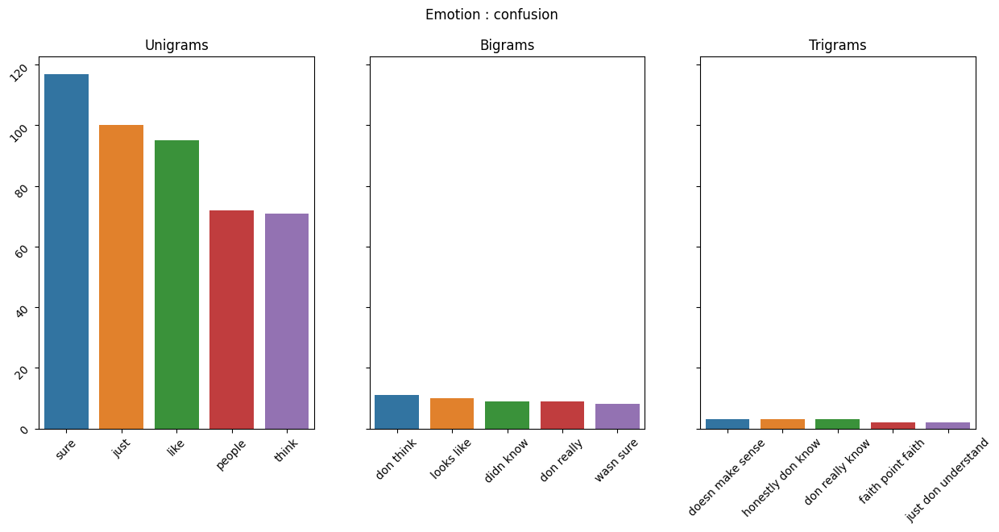

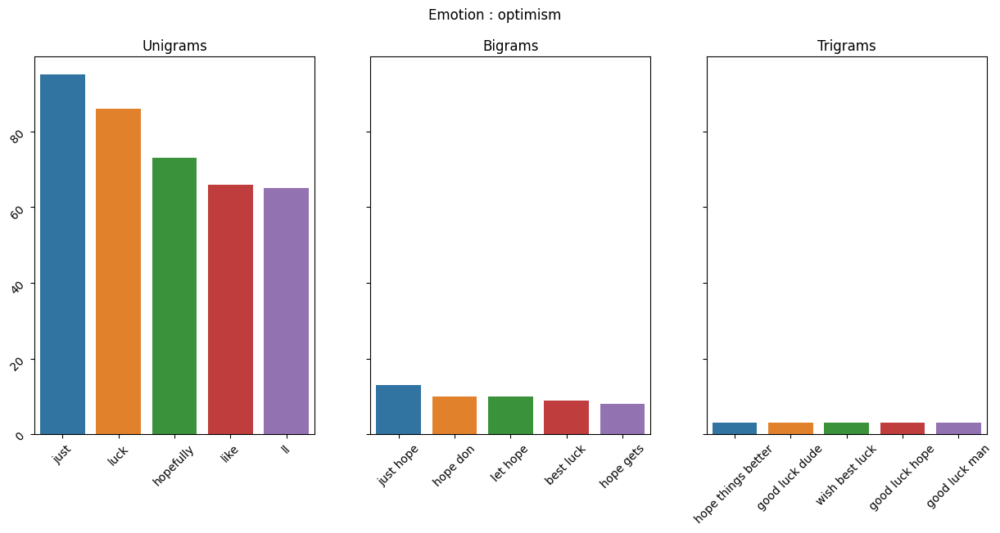

In [ ]:
for i in range(14):
  plot_ngram(emotion_df,grp_labels[i])


We can see many numbers are there, so we need to remove those in preprocessing

# Preload some functions which we need for our tasks

Function to get multilabel dataset to single dataset

In [ ]:
def multiple_label_explode(df): # use explode to make the multilabel data to singular data using the different labels
  df['new_labels'] = df['labels'].apply(lambda x: [{'label': label} for label in x])
  # explode the dataframe on the 'new_labels' column
  df = df.explode('new_labels')
  # create a new column with the value of the 'label' key in the 'new_labels' column
  df['label'] = df['new_labels'].apply(lambda x: x['label'])
  df = df.drop(['labels', 'new_labels'], axis=1)
  df = df.reset_index(drop=True)
  df['label'] = df['label'].apply(lambda x: [x])
  return df

Function to not use explode but use hierarchical labelling

In [ ]:
def hierarchical_label(df1):
  df = df1.copy()
  df = df
  df["class_label"] = ""

  # Iterate through each instance in the dataframe and assign the class label based on the hierarchy
  for i, row in df.iterrows():
      labels = row["labels"]  # Extract the labels assigned to the instance as a list of integers
      highest_rank = float("inf")  # Initialize the highest rank to infinity
      
      # Iterate through each label and determine its rank based on the hierarchy
      for label in labels:
          rank = label_hierarchy[label]
          if rank < highest_rank:
              highest_rank = rank  # Update the highest rank if the label has a higher rank than the current highest rank
      
      # Assign the corresponding class label based on the highest ranking label
      for label, rank in label_hierarchy.items():
          if rank == highest_rank:
              df.at[i, "class_label"] = label
              break  # Break the loop once the corresponding label has been assigned to the instance
  df["label"] = df["class_label"].apply(lambda x: [x])
  df = df.drop(columns='class_label')
  df = df.drop(columns='labels')
  return df

Function to remove the unwanted labels

In [ ]:
def remove_labels(df):
  # This maps the labels to the label_dict at the start of this notebook
  #and then makes a new column out of it
  df['string_labels'] = df['label'].apply(lambda x: [label_dict[label] for label in x])
  # This takes the label_dict and keeps only the rows in the grp_labels
  df_filtered = df[df['label'].apply(lambda x: any(label_dict[item] in grp_labels for item in x))]
  df_filtered = df_filtered.reset_index(drop=True)
  return df_filtered

Function to make the labels from 0-27 to 0-13

In [ ]:
def order_grp_labels(df):
  label_dict = {label: index for index, label in enumerate(grp_labels)}

  def convert_labels(labels):
      return [label_dict[label] for label in labels]

  df["label"] = df["string_labels"].apply(convert_labels)
  df = df.reset_index(drop=True).drop(columns='string_labels')
  return df

Function to display the bar graph for dataset

In [ ]:
def display_bar_graph(df1):

  df = df1.copy()
  if df['label'].dtype == 'object':
    df['label'] = df['label'].apply(lambda x: x[0])
  label_counts = df["label"].value_counts().sort_index()
  label_names = [grp_labels_dict[key] for key in label_counts.keys()]
  plt.bar(label_names, label_counts.values)
  plt.xticks(range(len(grp_labels_dict)), grp_labels_dict.values(), rotation=90)
  plt.title("Number of Samples per Label")
  plt.xlabel("Label")
  plt.ylabel("Number of Samples")
  plt.show()

Function to remove emoticon and emoji

In [ ]:
def remove_emoji(df):
  def convert_emojis(text):
      for emot in UNICODE_EMOJI:
          if emot in text:
              orig = text
              text = text.replace(emot, "_".join(UNICODE_EMOJI[emot].replace(",","").replace(":","").split()))
              # print(f'{orig} -> {text}', '\n')
      return text

  def convert_emoticons(text):
      for emot in EMOTICONS_EMO:
          if emot in text:
              orig = text
              text = text.replace(emot, "_".join(EMOTICONS_EMO[emot].split()))
              # print(f'{orig} -> {text}', '\n')
      return text
  df['text'] = df['text'].apply(lambda x: convert_emojis(x))
  df['text'] = df['text'].apply(lambda x: convert_emoticons(x))
  return df

Function to remove characters and symbols

In [ ]:
def remove_unnecessary(df):
  df = df
  pattern = r'[^a-zA-Z0-9\s]'
  def clean_text(text):
      text = re.sub(pattern, '', text)
      return text
  df['text'] = df['text'].apply(clean_text)
  return df

Function to remove stopwords

In [ ]:
def remove_stopwords(df):
  df = df
  def remove_stop(text):
    doc = nlp(text)
    filtered_tokens = [token.text for token in doc if not token.is_stop]
    filtered_text = ' '.join(filtered_tokens)
    return filtered_text
  df['text'] = df['text'].apply(remove_stop)
  return df

Function to perform stemming

In [ ]:
def stemm(df):
  porter = PorterStemmer()
  df = df
  def stem_text(text):
      words = text.split()
      stemmed_words = [porter.stem(word) for word in words]
      stemmed_text = ' '.join(stemmed_words)
      return stemmed_text
  df['text'] = df['text'].apply(stem_text)
  return df

Function to perform Lemmatization

In [ ]:
def lemmatization(df):
  df = df
  def lemma(text):
    doc = nlp(text)
    lemmatized_text = ' '.join([token.lemma_ for token in doc if token.pos_ in ['NOUN', 'ADJ', 'VERB', 'ADV']])
    return lemmatized_text
  df['text'] = df['text'].apply(lemma)
  return df

Function for tokenization

In [ ]:
def tokenize_self(df):
  df = df
  def tokenize_text(sentence):
      sentence = sentence.lower()
      words = word_tokenize(sentence)
      return words
  df['tokens'] = df['text'].apply(tokenize_text)
  return df

Spellchecker

In [ ]:
def spell_checker(df):
  spell = SpellChecker()

  def spell_check(text):
      if text is None:
          return ''
      try:
          words = text.split()
      except AttributeError:
          return ''
      corrected_words = []
      for word in words:
          try:
              corrected_word = spell.correction(word)
          except AttributeError:
              continue
          if corrected_word:
              corrected_words.append(corrected_word)
          else:
              corrected_words.append(word)
      return ' '.join(corrected_words)


  df['text'] = df['text'].apply(spell_check)
  return df

Function for normalization

In [ ]:
def normalization(df):
  def normalize_text(text):

      text = text.lower()
      
      # remove punctuation
      text = re.sub(r'[^\w\s]', '', text)
      
      # remove extra whitespaces
      text = re.sub(r'\s+', ' ', text)
      
      # replace numbers with a special token
      text = re.sub(r'\d+', 'NUM', text)

      # remove num token
      text = re.sub(r'NUM', '', text, flags=re.IGNORECASE)
      
      return text.strip()

  df['text'] = df['text'].apply(normalize_text)
  return df

Function to undersample the excess data (for this we took 3000)

In [ ]:
def undersample(df, threshold = 3000):


  # threshold size for undesampling
  threshold = threshold # Maximum number of samples in class
  df_change = df
  # Make all the labels from list to int
  df_change['label'] = df_change['label'].apply(lambda x: x[0])
  # Get the count of each label
  label_counts = Counter(df_change['label'])

  # Find the labels with more than downsample_size examples
  labels_to_downsample = [label for label, count in label_counts.items() if count > threshold]

  # Undersample examples for the selected classes
  df_balanced = pd.DataFrame()
  for label in label_counts.keys():
      if label not in labels_to_downsample:
          df_class = df_change[df_change['label'] == label]
          df_balanced = pd.concat([df_balanced, df_class])
      else:
          num_examples = threshold
          df_class = df_change[df_change['label'] == label]
          df_downsampled = df_class.sample(num_examples, random_state=42)
          df_balanced = pd.concat([df_balanced, df_downsampled])

  df_balanced = df_balanced.sample(frac=1, random_state=42)

  print('The number of labels in each class is :', Counter(df_balanced['label'])) 
  return Counter(df_balanced['label']),df_balanced.reset_index(drop=True)


Function to balance the dataframe to 3000

In [ ]:
def balance_df(df):
    # count the number of samples in each class
    counts = Counter(df.label)
    
    # get the label with the largest count
    majority_label = max(counts, key=counts.get)
    
    # create a list of dataframes, one for each class except the majority one
    minority_dfs = []
    for label in counts:
        if label != majority_label:
            # duplicate the minority class rows until it has the same count as the majority class
            minority_df = df[df.label == label]
            minority_df = pd.concat([minority_df]*int(counts[majority_label]/counts[label]), ignore_index=True)
            minority_dfs.append(minority_df)
    
    # concatenate the majority class dataframe with the list of minority class dataframes
    df_balanced = pd.concat([df[df.label == majority_label]] + minority_dfs, ignore_index=True)
    
    return df_balanced

Function to show confusion matrix

In [ ]:
def confusion_matrix_self(model, X_test, y_test):
  print('CLASSIFICATION REPORT')
  y_pred = model.predict(X_test)
  report = classification_report(y_test, y_pred, target_names= grp_labels, output_dict=True)
  df = pd.DataFrame(report).transpose()
  df = df.drop('support', axis=1)
  cmap = sns.diverging_palette(220, 10, as_cmap=True)
  sns.heatmap(df, cmap=cmap, annot=True, fmt='.2f')
  plt.xlabel('Metrics')
  plt.ylabel('Class')
  plt.title('Classification Report')
  plt.show
  print('CONFUSION MATRIX')

  cm = confusion_matrix(y_test, y_pred)

  sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')

  plt.xlabel('Predicted labels')
  plt.ylabel('True labels')
  plt.title('Confusion matrix')
  plt.show

MAIN FUNCTION TO PRE-PROCESS

In [ ]:
def data_preprocess(df):
  #df = multiple_label_explode(df)
  # df = hierarchical_label(df)
  # df = remove_labels(df)
  # df = order_grp_labels(df)
  # df = remove_emoji(df)
  # df = remove_unnecessary(df)
  # df = remove_stopwords(df)
  # df = stemm(df)
  # df = lemmatization(df)
  # df = spell_checker(df)
  # df = normalization(df)
  return df

before starting with out experiments, we will club the datasets together, so we can preprocess on all datasets at once

In [ ]:
dataframe_orig = pd.concat([train_data, test_data, validation_data], ignore_index=True)

# EXPERIMENT 1 - Data Preprocessing

In [ ]:
df_exp1 = dataframe_orig.copy()
multiple_labels = len(df_exp1[df_exp1['labels'].apply(lambda x: len(x) > 1)])
multiple_labels

8817

## Variation - A (multilabel handler)

We will need to preprocess our data using one of the multilabel handler function (we will compare 2 label handlers)

In [ ]:
def data_preprocess(df):
  # df = multiple_label_explode(df)
  df = hierarchical_label(df)
  df = remove_labels(df)
  df = order_grp_labels(df)
  df = remove_emoji(df)
  df = remove_unnecessary(df)
  df = remove_stopwords(df)
  # df = stemm(df)
  # df = lemmatization(df)
  # df = spell_checker(df)
  df = normalization(df)
  return df

In [ ]:
df_exp1 = data_preprocess(df_exp1)

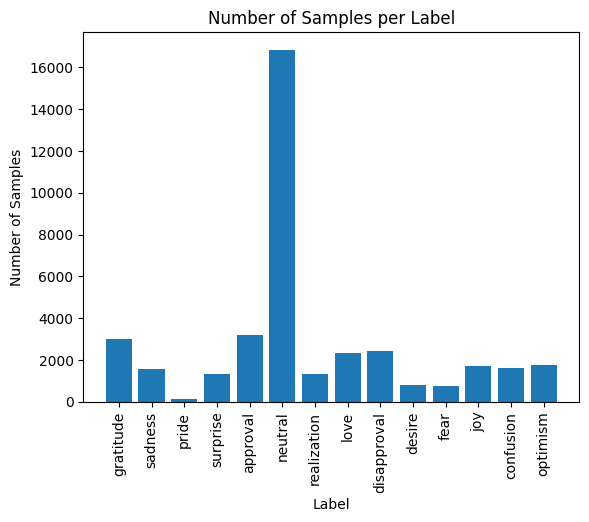

In [ ]:
display_bar_graph(df_exp1)

In [ ]:
df_exp1['label'] = [int(label[0]) for label in df_exp1['label']]

In [ ]:
count = Counter(df_exp1['label'])
df_exp1['label'] = df_exp1['label'].apply(lambda x: [x])
count

Counter({5: 16843,
         10: 764,
         3: 1315,
         0: 2982,
         9: 800,
         12: 1603,
         4: 3174,
         6: 1326,
         1: 1558,
         11: 1704,
         7: 2335,
         8: 2447,
         13: 1751,
         2: 142})

In [ ]:
count,df_exp1 = undersample(df_exp1, 3687) # cut down the number of samples to 3687

The number of labels in each class is : Counter({5: 3687, 4: 3174, 0: 2982, 8: 2447, 7: 2335, 13: 1751, 11: 1704, 12: 1603, 1: 1558, 6: 1326, 3: 1315, 9: 800, 10: 764, 2: 142})


In [ ]:
df_exp1 = shuffle(df_exp1, random_state=42) # Shuffle the dataset
df_exp1 = df_exp1.reset_index(drop=True) # Reset_index
df_exp1 = tokenize_self(df_exp1) # Tokenize the data
df_exp1 = df_exp1.drop(columns='text') #drop column of text

test, train, val split (80/10/10 split)

In [ ]:


train_df, test_df = train_test_split(df_exp1, test_size=0.1, random_state=42)
train_df, val_df = train_test_split(train_df, test_size=0.1, random_state=42)



In [ ]:
#Vectorization
vectorizer = TfidfVectorizer()
train_token = [' '.join(tokens) for tokens in train_df['tokens']]
vectorizer.fit(train_token) #fit vectorizer on train data
train_vectors = vectorizer.transform(train_token) # transform the tokenized data into TF-IDF vectors

In [ ]:
y_train = np.array(train_df['label'])
y_test = np.array(test_df['label'])
y_val = np.array(val_df['label'])

In [ ]:
val_token = [' '.join(tokens) for tokens in val_df['tokens']]
val_vectors = vectorizer.transform(val_token)

In [ ]:
X_train = train_vectors
X_val = val_vectors
model = SVC(kernel='rbf', C=1, gamma='scale', random_state=42) # SVM with radial basis function kernel
model.fit(X_train, y_train)
accuracy = model.score(X_val, y_val)
print(f"Validation accuracy: {accuracy}")

Validation accuracy: 0.5397307859313938


In [ ]:
text = "I am so sad"

# Vectorize your text
vector = vectorizer.transform([text])

# Predict the emotion
prediction = model.predict(vector)[0]

grp_labels_dict[prediction] #predict the result on my own text

'sadness'

In [ ]:
test_token = [' '.join(tokens) for tokens in test_df['tokens']]


# Transform the tokenized data into TF-IDF vectors
test_vectors = vectorizer.transform(test_token)
X_test = test_vectors

In [ ]:
# Make predictions on the validation set
y_pred = model.predict(X_test)

# Generate a classification report
report = classification_report(y_test, y_pred, target_names= grp_labels, output_dict=True)

print(report)

{'gratitude': {'precision': 0.8725490196078431, 'recall': 0.898989898989899, 'f1-score': 0.8855721393034826, 'support': 297}, 'sadness': {'precision': 0.7340425531914894, 'recall': 0.5073529411764706, 'f1-score': 0.6, 'support': 136}, 'pride': {'precision': 0.8571428571428571, 'recall': 0.3157894736842105, 'f1-score': 0.46153846153846156, 'support': 19}, 'surprise': {'precision': 0.7019230769230769, 'recall': 0.6083333333333333, 'f1-score': 0.6517857142857143, 'support': 120}, 'approval': {'precision': 0.39274924471299094, 'recall': 0.43333333333333335, 'f1-score': 0.4120443740095087, 'support': 300}, 'neutral': {'precision': 0.3471882640586797, 'recall': 0.7029702970297029, 'f1-score': 0.4648117839607201, 'support': 404}, 'realization': {'precision': 0.46153846153846156, 'recall': 0.08695652173913043, 'f1-score': 0.14634146341463414, 'support': 138}, 'love': {'precision': 0.75, 'recall': 0.8170212765957446, 'f1-score': 0.7820773930753565, 'support': 235}, 'disapproval': {'precision': 

Classification Report for multilabel explode

Text(0.5, 1.0, 'multiple_label_explode')

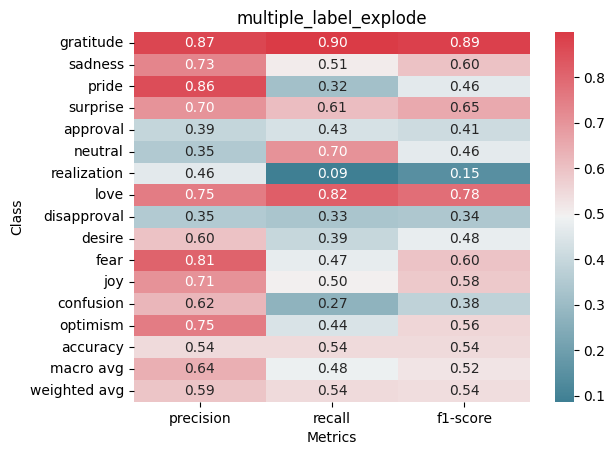

In [ ]:
df = pd.DataFrame(report).transpose()

# Remove the 'support' column from the DataFrame
df = df.drop('support', axis=1)

# Create a color map
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Create a color-coded heatmap of the classification report
sns.heatmap(df, cmap=cmap, annot=True, fmt='.2f')

# Set the axis labels and title
plt.xlabel('Metrics')
plt.ylabel('Class')
plt.title('multiple_label_explode')

Confusion Matrix for multilabel explode

Text(0.5, 1.0, 'multiple_label_explode')

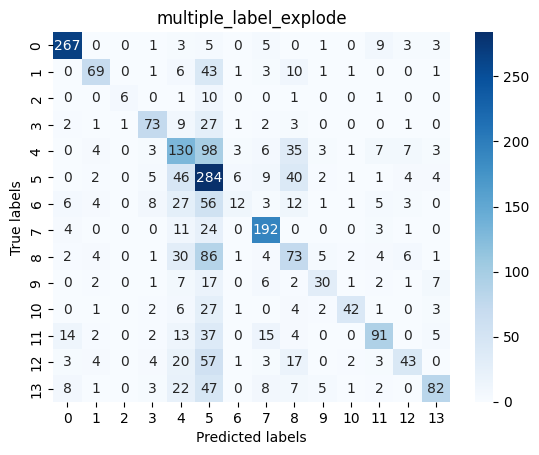

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
# Predict on test set
y_pred = model.predict(X_test)

# Get confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix as a heatmap
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')

# Set the axis labels and title
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('multiple_label_explode')

**Let's classify using other hierarchical labelling for multilabel**

In [ ]:
df_exp1 = dataframe_orig.copy()

In [ ]:
df_exp1

,text,labels
0,My favourite food is anything I didn't have to...,[27]
1,"Now if he does off himself, everyone will thin...",[27]
2,WHY THE FUCK IS BAYLESS ISOING,[2]
3,To make her feel threatened,[14]
4,Dirty Southern Wankers,[3]
...,...,...
54258,It's pretty dangerous when the state decides w...,[14]
54259,I filed for divorce this morning. Hoping he mo...,[20]
54260,"The last time it happened I just said, ""No"" an...",[10]
54261,I can’t stand this arrogant prick he’s no bett...,[3]


In [ ]:
def data_preprocess(df):
  # df = multiple_label_explode(df)
  df = hierarchical_label(df)
  df = remove_labels(df)
  df = order_grp_labels(df)
  df = remove_emoji(df)
  df = remove_unnecessary(df)
  df = remove_stopwords(df)
  # df = stemm(df)
  # df = lemmatization(df)
  # df = spell_checker(df)
  df = normalization(df)
  return df

In [ ]:
df_exp1 = data_preprocess(df_exp1)

In [ ]:
count,df_exp1 = undersample(df_exp1, 3687) # cut down the number of samples to 3687

The number of labels in each class is : Counter({5: 3687, 4: 3174, 0: 2982, 8: 2447, 7: 2335, 13: 1751, 11: 1704, 12: 1603, 1: 1558, 6: 1326, 3: 1315, 9: 800, 10: 764, 2: 142})


In [ ]:
df_exp1 = shuffle(df_exp1, random_state=42)
df_exp1 = df_exp1.reset_index(drop=True)
df_exp1 = tokenize_self(df_exp1)
df_exp1 = df_exp1.drop(columns='text')

In [ ]:


train_df, test_df = train_test_split(df_exp1, test_size=0.1, random_state=42)
train_df, val_df = train_test_split(train_df, test_size=0.1, random_state=42)



In [ ]:
# Initialize the vectorizer
vectorizer = TfidfVectorizer()
train_token = [' '.join(tokens) for tokens in train_df['tokens']]
# Fit the vectorizer to your tokenized data
vectorizer.fit(train_token)

# Transform the tokenized data into TF-IDF vectors
train_vectors = vectorizer.transform(train_token)

In [ ]:
y_train = np.array(train_df['label'])
y_test = np.array(test_df['label'])
y_val = np.array(val_df['label'])

In [ ]:
val_token = [' '.join(tokens) for tokens in val_df['tokens']]


# Transform the tokenized data into TF-IDF vectors
val_vectors = vectorizer.transform(val_token)

In [ ]:
X_train = train_vectors

X_val = val_vectors

# Define your model architecture (SVM with radial basis function kernel)
model = SVC(kernel='rbf', C=1, gamma='scale', random_state=42)

# Train your model on the training set
model.fit(X_train, y_train)

# Evaluate your model on the validation set
accuracy = model.score(X_val, y_val)

print(f"Validation accuracy: {accuracy}")

Validation accuracy: 0.5397307859313938


In [ ]:
text = "I am so sad"

# Vectorize your text
vector = vectorizer.transform([text])

# Predict the emotion
prediction = model.predict(vector)[0]

grp_labels_dict[prediction] #predict the result on my own text

'sadness'

In [ ]:
test_token = [' '.join(tokens) for tokens in test_df['tokens']]


# Transform the tokenized data into TF-IDF vectors
test_vectors = vectorizer.transform(test_token)
X_test = test_vectors

In [ ]:
# Make predictions on the validation set
y_pred = model.predict(X_test)

# Generate a classification report
report = classification_report(y_test, y_pred, target_names= grp_labels, output_dict=True)

print(report)

{'gratitude': {'precision': 0.8725490196078431, 'recall': 0.898989898989899, 'f1-score': 0.8855721393034826, 'support': 297}, 'sadness': {'precision': 0.7340425531914894, 'recall': 0.5073529411764706, 'f1-score': 0.6, 'support': 136}, 'pride': {'precision': 0.8571428571428571, 'recall': 0.3157894736842105, 'f1-score': 0.46153846153846156, 'support': 19}, 'surprise': {'precision': 0.7019230769230769, 'recall': 0.6083333333333333, 'f1-score': 0.6517857142857143, 'support': 120}, 'approval': {'precision': 0.39274924471299094, 'recall': 0.43333333333333335, 'f1-score': 0.4120443740095087, 'support': 300}, 'neutral': {'precision': 0.3471882640586797, 'recall': 0.7029702970297029, 'f1-score': 0.4648117839607201, 'support': 404}, 'realization': {'precision': 0.46153846153846156, 'recall': 0.08695652173913043, 'f1-score': 0.14634146341463414, 'support': 138}, 'love': {'precision': 0.75, 'recall': 0.8170212765957446, 'f1-score': 0.7820773930753565, 'support': 235}, 'disapproval': {'precision': 

Text(0.5, 1.0, 'hierarchical_label')

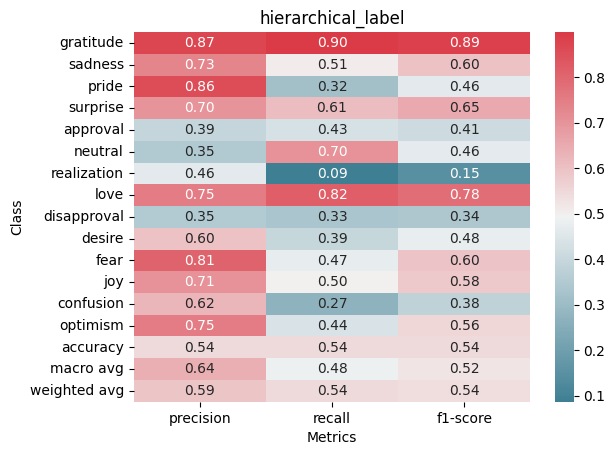

In [ ]:
df = pd.DataFrame(report).transpose()

# Remove the 'support' column from the DataFrame
df = df.drop('support', axis=1)

# Create a color map
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Create a color-coded heatmap of the classification report
sns.heatmap(df, cmap=cmap, annot=True, fmt='.2f')

# Set the axis labels and title
plt.xlabel('Metrics')
plt.ylabel('Class')
plt.title('hierarchical_label')

Text(0.5, 1.0, 'hierarchical_label')

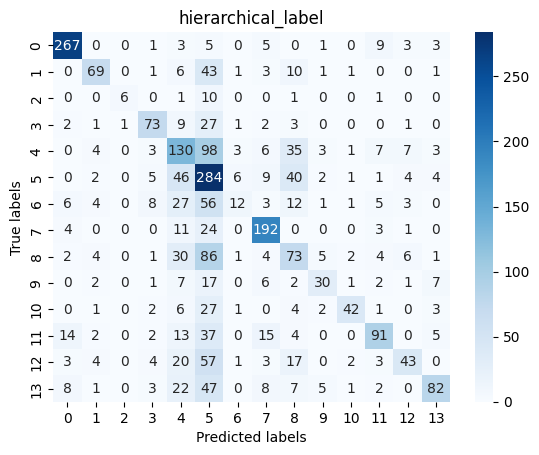

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
# Predict on test set
y_pred = model.predict(X_test)

# Get confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix as a heatmap
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')

# Set the axis labels and title
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('hierarchical_label')

HIERARCHICAL GONNE USE

## Variation - B (Use stemming but no stopwords)

Now, try without stopwords, but using stemming

In [ ]:
df_exp1 = dataframe_orig.copy()
def data_preprocess(df):
  # df = multiple_label_explode(df)
  df = hierarchical_label(df)
  df = remove_labels(df)
  df = order_grp_labels(df)
  df = remove_emoji(df)
  df = remove_unnecessary(df)
  # df = remove_stopwords(df)
  df = stemm(df)
  # df = lemmatization(df)
  # df = spell_checker(df)
  df = normalization(df)
  return df
df_exp1 = data_preprocess(df_exp1)
count,df_exp1 = undersample(df_exp1, 3687) # cut down the number of samples to 3687
df_exp1 = shuffle(df_exp1, random_state=42)
df_exp1 = df_exp1.reset_index(drop=True)
df_exp1 = tokenize_self(df_exp1)
df_exp1 = df_exp1.drop(columns='text')


train_df, test_df = train_test_split(df_exp1, test_size=0.1, random_state=42)
train_df, val_df = train_test_split(train_df, test_size=0.1, random_state=42)

# Initialize the vectorizer
vectorizer = TfidfVectorizer()
train_token = [' '.join(tokens) for tokens in train_df['tokens']]
# Fit the vectorizer to your tokenized data
vectorizer.fit(train_token)

# Transform the tokenized data into TF-IDF vectors
train_vectors = vectorizer.transform(train_token)
y_train = np.array(train_df['label'])
y_test = np.array(test_df['label'])
y_val = np.array(val_df['label'])
val_token = [' '.join(tokens) for tokens in val_df['tokens']]


# Transform the tokenized data into TF-IDF vectors
val_vectors = vectorizer.transform(val_token)
X_train = train_vectors

X_val = val_vectors

# Define your model architecture (SVM with radial basis function kernel)
model = SVC(kernel='rbf', C=1, gamma='scale', random_state=42)

# Train your model on the training set
model.fit(X_train, y_train)

# Evaluate your model on the validation set
accuracy = model.score(X_val, y_val)

print(f"Validation accuracy: {accuracy}")
test_token = [' '.join(tokens) for tokens in test_df['tokens']]


# Transform the tokenized data into TF-IDF vectors
test_vectors = vectorizer.transform(test_token)
X_test = test_vectors
# Make predictions on the validation set
y_pred = model.predict(X_test)

# Generate a classification report
report = classification_report(y_test, y_pred, target_names= grp_labels, output_dict=True)


The number of labels in each class is : Counter({5: 3687, 4: 3174, 0: 2982, 8: 2447, 7: 2335, 13: 1751, 11: 1704, 12: 1603, 1: 1558, 6: 1326, 3: 1315, 9: 800, 10: 764, 2: 142})
Validation accuracy: 0.5601389491966999


Text(0.5, 1.0, 'Stemming (No Stopwords)')

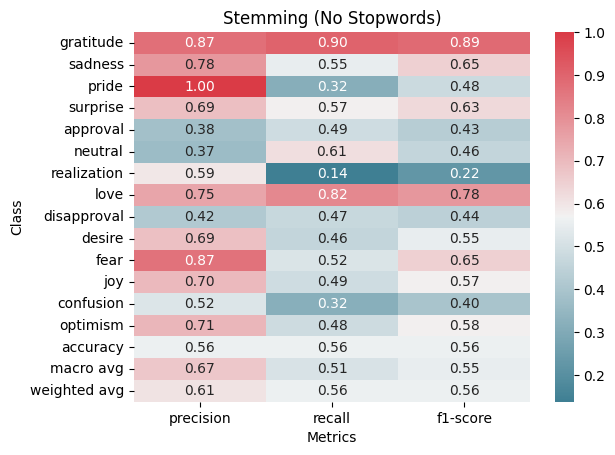

In [ ]:
df = pd.DataFrame(report).transpose()

# Remove the 'support' column from the DataFrame
df = df.drop('support', axis=1)

# Create a color map
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Create a color-coded heatmap of the classification report
sns.heatmap(df, cmap=cmap, annot=True, fmt='.2f')

# Set the axis labels and title
plt.xlabel('Metrics')
plt.ylabel('Class')
plt.title('Stemming (No Stopwords)')

Text(0.5, 1.0, 'Stemming (No Stopwords)')

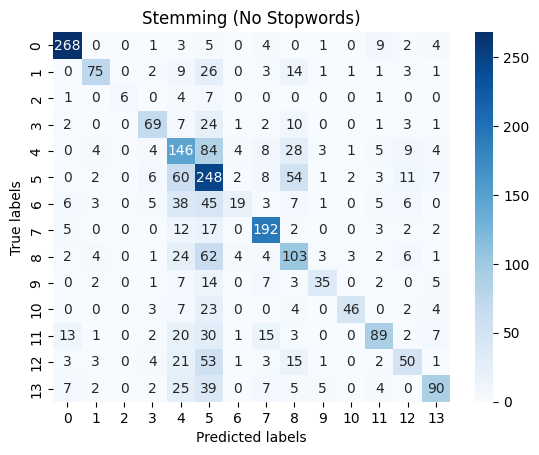

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
# Predict on test set
y_pred = model.predict(X_test)

# Get confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix as a heatmap
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')

# Set the axis labels and title
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Stemming (No Stopwords)')

## Variation - C (Use lemmatization but no stopwords)

lemmatizqation

In [ ]:
df_exp1 = dataframe_orig.copy()
def data_preprocess(df):
  # df = multiple_label_explode(df)
  df = hierarchical_label(df)
  df = remove_labels(df)
  df = order_grp_labels(df)
  df = remove_emoji(df)
  df = remove_unnecessary(df)
  # df = remove_stopwords(df)
  # df = stemm(df)
  df = lemmatization(df)
  # df = spell_checker(df)
  df = normalization(df)
  return df
df_exp1 = data_preprocess(df_exp1)
count,df_exp1 = undersample(df_exp1, 3687) # cut down the number of samples to 3687
df_exp1 = shuffle(df_exp1, random_state=42)
df_exp1 = df_exp1.reset_index(drop=True)
df_exp1 = tokenize_self(df_exp1)
df_exp1 = df_exp1.drop(columns='text')


train_df, test_df = train_test_split(df_exp1, test_size=0.1, random_state=42)
train_df, val_df = train_test_split(train_df, test_size=0.1, random_state=42)

# Initialize the vectorizer
vectorizer = TfidfVectorizer()
train_token = [' '.join(tokens) for tokens in train_df['tokens']]
# Fit the vectorizer to your tokenized data
vectorizer.fit(train_token)

# Transform the tokenized data into TF-IDF vectors
train_vectors = vectorizer.transform(train_token)
y_train = np.array(train_df['label'])
y_test = np.array(test_df['label'])
y_val = np.array(val_df['label'])
val_token = [' '.join(tokens) for tokens in val_df['tokens']]


# Transform the tokenized data into TF-IDF vectors
val_vectors = vectorizer.transform(val_token)
X_train = train_vectors

X_val = val_vectors

# Define your model architecture (SVM with radial basis function kernel)
model = SVC(kernel='rbf', C=1, gamma='scale', random_state=42)

# Train your model on the training set
model.fit(X_train, y_train)

# Evaluate your model on the validation set
accuracy = model.score(X_val, y_val)

print(f"Validation accuracy: {accuracy}")
test_token = [' '.join(tokens) for tokens in test_df['tokens']]

test_vectors = vectorizer.transform(test_token)
X_test = test_vectors
# Make predictions on the validation set
y_pred = model.predict(X_test)

# Generate a classification report
report = classification_report(y_test, y_pred, target_names= grp_labels, output_dict=True)


The number of labels in each class is : Counter({5: 3687, 4: 3174, 0: 2982, 8: 2447, 7: 2335, 13: 1751, 11: 1704, 12: 1603, 1: 1558, 6: 1326, 3: 1315, 9: 800, 10: 764, 2: 142})
Validation accuracy: 0.5106382978723404


Text(0.5, 1.0, 'Lemmatization (no stopwords)')

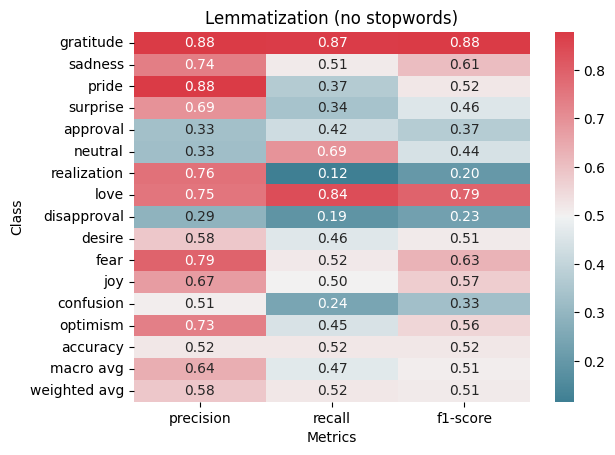

In [ ]:
df = pd.DataFrame(report).transpose()

# Remove the 'support' column from the DataFrame
df = df.drop('support', axis=1)

# Create a color map
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Create a color-coded heatmap of the classification report
sns.heatmap(df, cmap=cmap, annot=True, fmt='.2f')

# Set the axis labels and title
plt.xlabel('Metrics')
plt.ylabel('Class')
plt.title('Lemmatization (no stopwords)')

Text(0.5, 1.0, 'Lemmatization (no stopwords)')

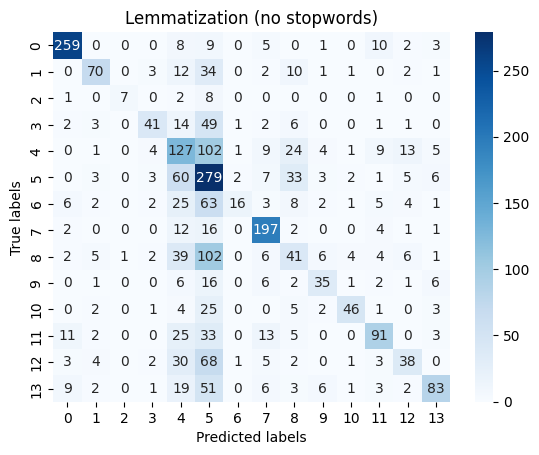

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
# Predict on test set
y_pred = model.predict(X_test)

# Get confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix as a heatmap
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')

# Set the axis labels and title
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Lemmatization (no stopwords)')

## Variation - D (stopwords plus lemmatiozation)

stop + lemm

In [ ]:
df_exp1 = dataframe_orig.copy()
def data_preprocess(df):
  # df = multiple_label_explode(df)
  df = hierarchical_label(df)
  df = remove_labels(df)
  df = order_grp_labels(df)
  df = remove_emoji(df)
  df = remove_unnecessary(df)
  df = remove_stopwords(df)
  # df = stemm(df)
  df = lemmatization(df)
  # df = spell_checker(df)
  df = normalization(df)
  return df
df_exp1 = data_preprocess(df_exp1)
count,df_exp1 = undersample(df_exp1, 3687) # cut down the number of samples to 3687
df_exp1 = shuffle(df_exp1, random_state=42)
df_exp1 = df_exp1.reset_index(drop=True)
df_exp1 = tokenize_self(df_exp1)
df_exp1 = df_exp1.drop(columns='text')


train_df, test_df = train_test_split(df_exp1, test_size=0.1, random_state=42)
train_df, val_df = train_test_split(train_df, test_size=0.1, random_state=42)

# Initialize the vectorizer
vectorizer = TfidfVectorizer()
train_token = [' '.join(tokens) for tokens in train_df['tokens']]
# Fit the vectorizer to your tokenized data
vectorizer.fit(train_token)

# Transform the tokenized data into TF-IDF vectors
train_vectors = vectorizer.transform(train_token)
y_train = np.array(train_df['label'])
y_test = np.array(test_df['label'])
y_val = np.array(val_df['label'])
val_token = [' '.join(tokens) for tokens in val_df['tokens']]


# Transform the tokenized data into TF-IDF vectors
val_vectors = vectorizer.transform(val_token)
X_train = train_vectors

X_val = val_vectors

# Define your model architecture (SVM with radial basis function kernel)
model = SVC(kernel='rbf', C=1, gamma='scale', random_state=42)

# Train your model on the training set
model.fit(X_train, y_train)

# Evaluate your model on the validation set
accuracy = model.score(X_val, y_val)

print(f"Validation accuracy: {accuracy}")
test_token = [' '.join(tokens) for tokens in test_df['tokens']]


# Transform the tokenized data into TF-IDF vectors
test_vectors = vectorizer.transform(test_token)
X_test = test_vectors
# Make predictions on the validation set
y_pred = model.predict(X_test)

# Generate a classification report
report = classification_report(y_test, y_pred, target_names= grp_labels, output_dict=True)


The number of labels in each class is : Counter({5: 3687, 4: 3174, 0: 2982, 8: 2447, 7: 2335, 13: 1751, 11: 1704, 12: 1603, 1: 1558, 6: 1326, 3: 1315, 9: 800, 10: 764, 2: 142})
Validation accuracy: 0.4806773773339123


Text(0.5, 1.0, 'Lemmatization + Stopwords')

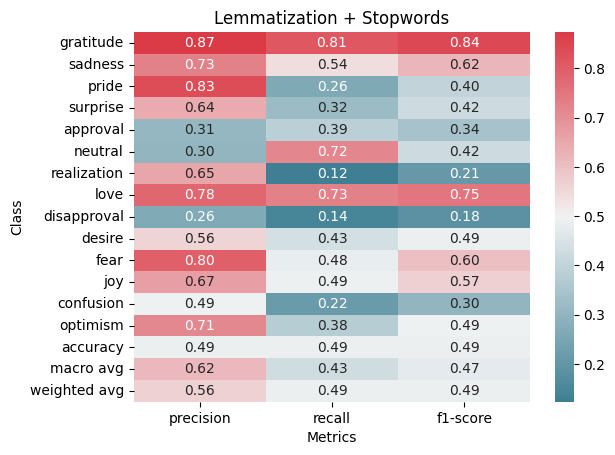

In [ ]:
df = pd.DataFrame(report).transpose()

# Remove the 'support' column from the DataFrame
df = df.drop('support', axis=1)

# Create a color map
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Create a color-coded heatmap of the classification report
sns.heatmap(df, cmap=cmap, annot=True, fmt='.2f')

# Set the axis labels and title
plt.xlabel('Metrics')
plt.ylabel('Class')
plt.title('Lemmatization + Stopwords')

Text(0.5, 1.0, 'Lemmatization + Stopwords')

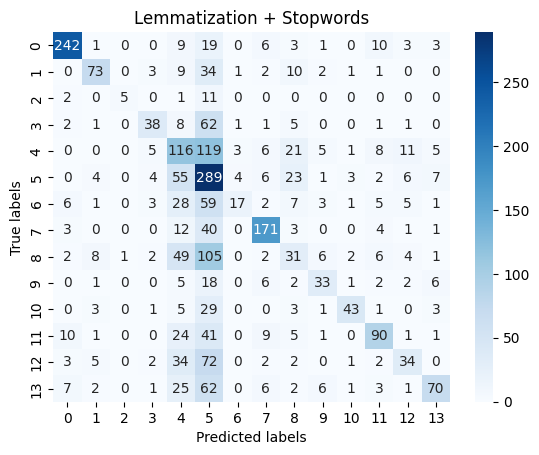

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
# Predict on test set
y_pred = model.predict(X_test)

# Get confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix as a heatmap
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')

# Set the axis labels and title
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Lemmatization + Stopwords')

## Variation - E (stopwords plus stemming)

stop+stemm

In [ ]:
df_exp1 = dataframe_orig.copy()
def data_preprocess(df):
  # df = multiple_label_explode(df)
  df = hierarchical_label(df)
  df = remove_labels(df)
  df = order_grp_labels(df)
  df = remove_emoji(df)
  df = remove_unnecessary(df)
  df = remove_stopwords(df)
  df = stemm(df)
  # df = lemmatization(df)
  # df = spell_checker(df)
  df = normalization(df)
  return df
df_exp1 = data_preprocess(df_exp1)
count,df_exp1 = undersample(df_exp1, 3687) # cut down the number of samples to 3687
df_exp1 = shuffle(df_exp1, random_state=42)
df_exp1 = df_exp1.reset_index(drop=True)
df_exp1 = tokenize_self(df_exp1)
df_exp1 = df_exp1.drop(columns='text')


train_df, test_df = train_test_split(df_exp1, test_size=0.1, random_state=42)
train_df, val_df = train_test_split(train_df, test_size=0.1, random_state=42)

# Initialize the vectorizer
vectorizer = TfidfVectorizer()
train_token = [' '.join(tokens) for tokens in train_df['tokens']]
# Fit the vectorizer to your tokenized data
vectorizer.fit(train_token)

# Transform the tokenized data into TF-IDF vectors
train_vectors = vectorizer.transform(train_token)
y_train = np.array(train_df['label'])
y_test = np.array(test_df['label'])
y_val = np.array(val_df['label'])
val_token = [' '.join(tokens) for tokens in val_df['tokens']]


# Transform the tokenized data into TF-IDF vectors
val_vectors = vectorizer.transform(val_token)
X_train = train_vectors

X_val = val_vectors

# Define your model architecture (SVM with radial basis function kernel)
model = SVC(kernel='rbf', C=1, gamma='scale', random_state=42)

# Train your model on the training set
model.fit(X_train, y_train)

# Evaluate your model on the validation set
accuracy = model.score(X_val, y_val)

print(f"Validation accuracy: {accuracy}")
test_token = [' '.join(tokens) for tokens in test_df['tokens']]


# Transform the tokenized data into TF-IDF vectors
test_vectors = vectorizer.transform(test_token)
X_test = test_vectors
# Make predictions on the validation set
y_pred = model.predict(X_test)

# Generate a classification report
report = classification_report(y_test, y_pred, target_names= grp_labels, output_dict=True)


The number of labels in each class is : Counter({5: 3687, 4: 3174, 0: 2982, 8: 2447, 7: 2335, 13: 1751, 11: 1704, 12: 1603, 1: 1558, 6: 1326, 3: 1315, 9: 800, 10: 764, 2: 142})
Validation accuracy: 0.5497177594442032


Text(0.5, 1.0, 'Stemming + Stopwords')

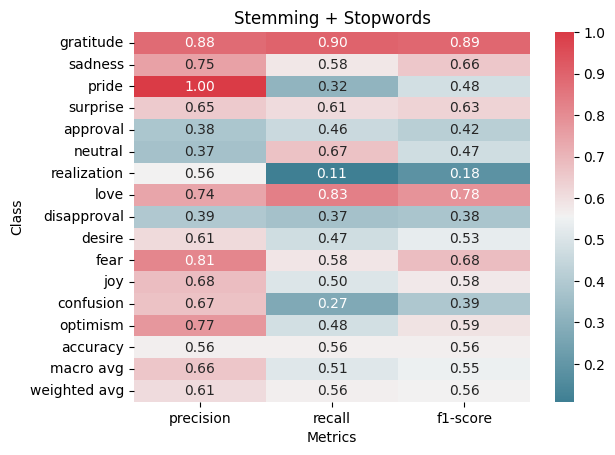

In [ ]:
df = pd.DataFrame(report).transpose()

# Remove the 'support' column from the DataFrame
df = df.drop('support', axis=1)

# Create a color map
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Create a color-coded heatmap of the classification report
sns.heatmap(df, cmap=cmap, annot=True, fmt='.2f')

# Set the axis labels and title
plt.xlabel('Metrics')
plt.ylabel('Class')
plt.title('Stemming + Stopwords')

Text(0.5, 1.0, 'Stemming + Stopwords')

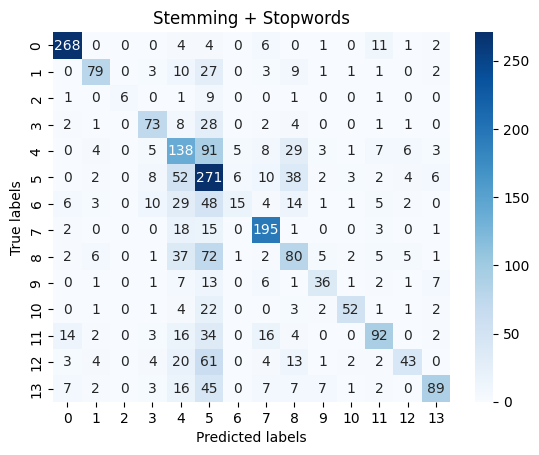

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
# Predict on test set
y_pred = model.predict(X_test)

# Get confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix as a heatmap
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')

# Set the axis labels and title
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Stemming + Stopwords')

## Variation - F (use of n-grams)

Now lets try the use of ngrams

In [ ]:
df_exp1 = dataframe_orig.copy()
def data_preprocess(df):
  # df = multiple_label_explode(df)
  df = hierarchical_label(df)
  df = remove_labels(df)
  df = order_grp_labels(df)
  df = remove_emoji(df)
  df = remove_unnecessary(df)
  # df = remove_stopwords(df)
  # df = stemm(df)
  df = lemmatization(df)
  # df = spell_checker(df)
  df = normalization(df)
  return df
df_exp1 = data_preprocess(df_exp1)
count,df_exp1 = undersample(df_exp1, 3687) # cut down the number of samples to 3687
df_exp1 = shuffle(df_exp1, random_state=42)
df_exp1 = df_exp1.reset_index(drop=True)


The number of labels in each class is : Counter({5: 3687, 4: 3174, 0: 2982, 8: 2447, 7: 2335, 13: 1751, 11: 1704, 12: 1603, 1: 1558, 6: 1326, 3: 1315, 9: 800, 10: 764, 2: 142})


In [ ]:

emotion_df={}
for label, emotion in grp_labels_dict.items():
    emotion_df[emotion] = visualize[visualize['label'] == label]['text']

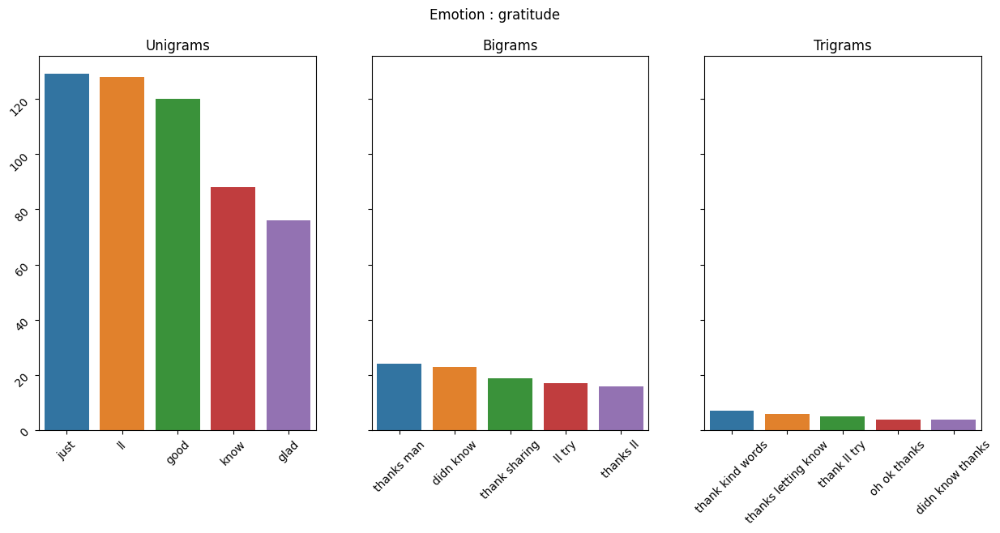

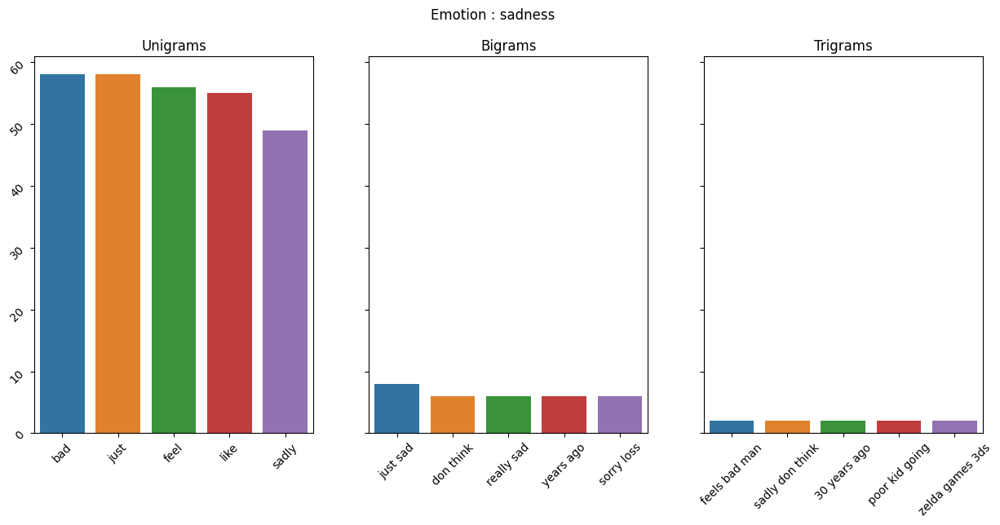

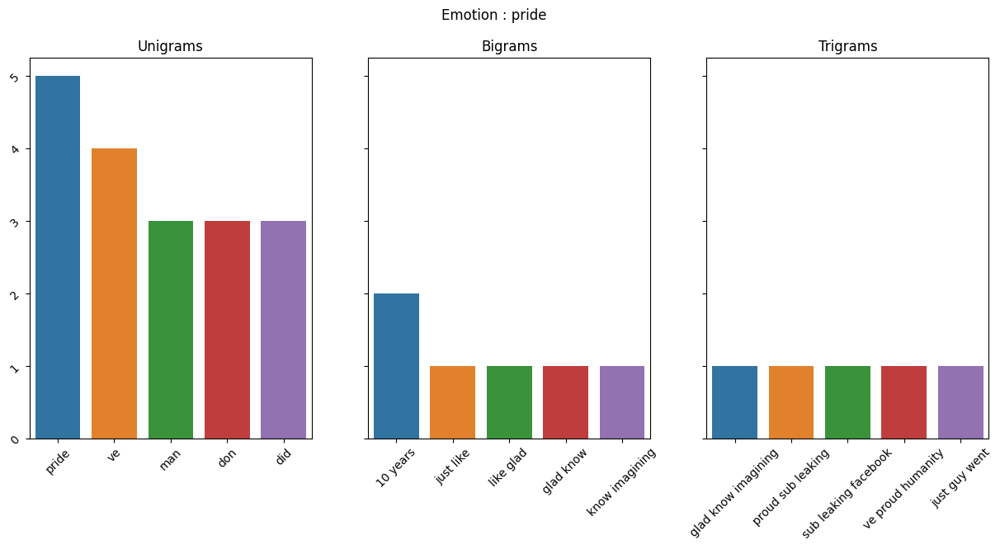

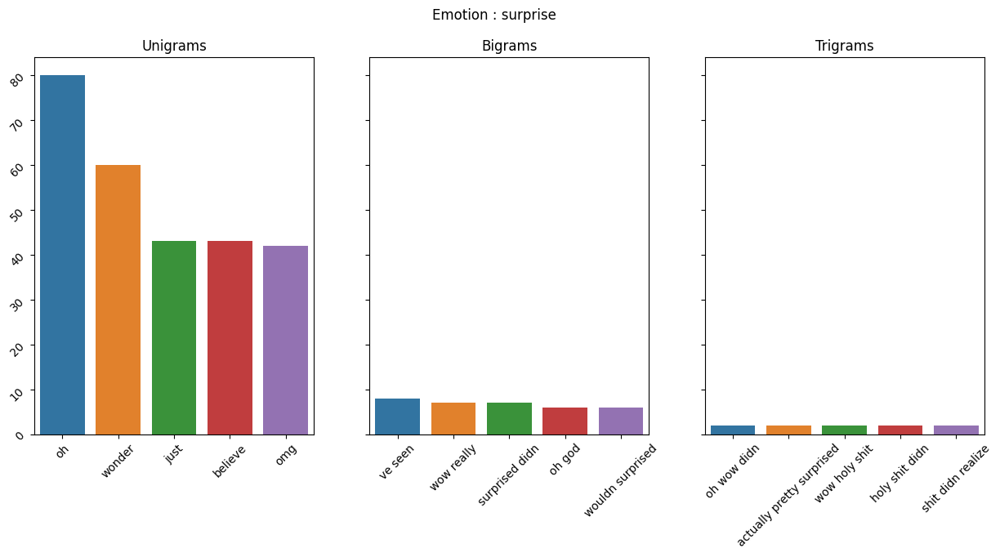

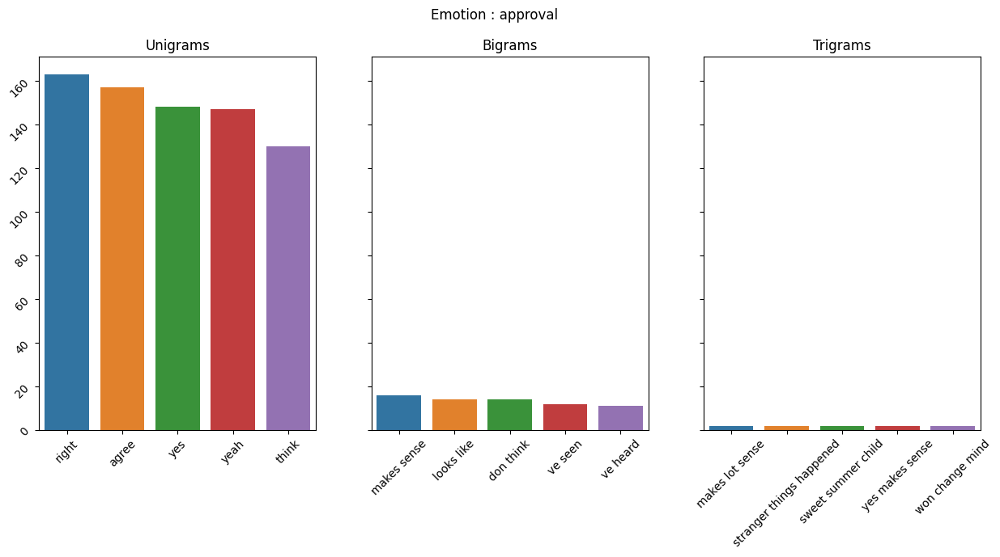

...

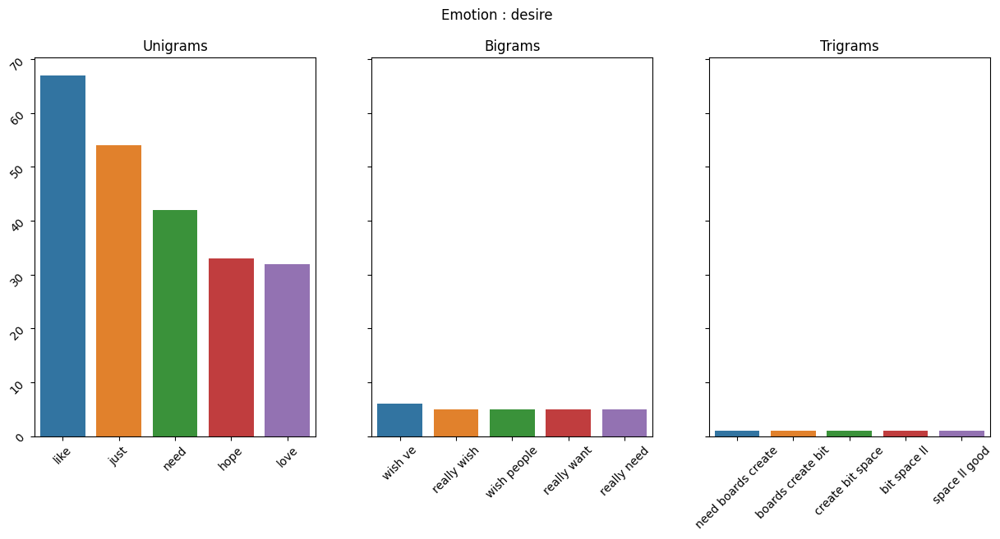

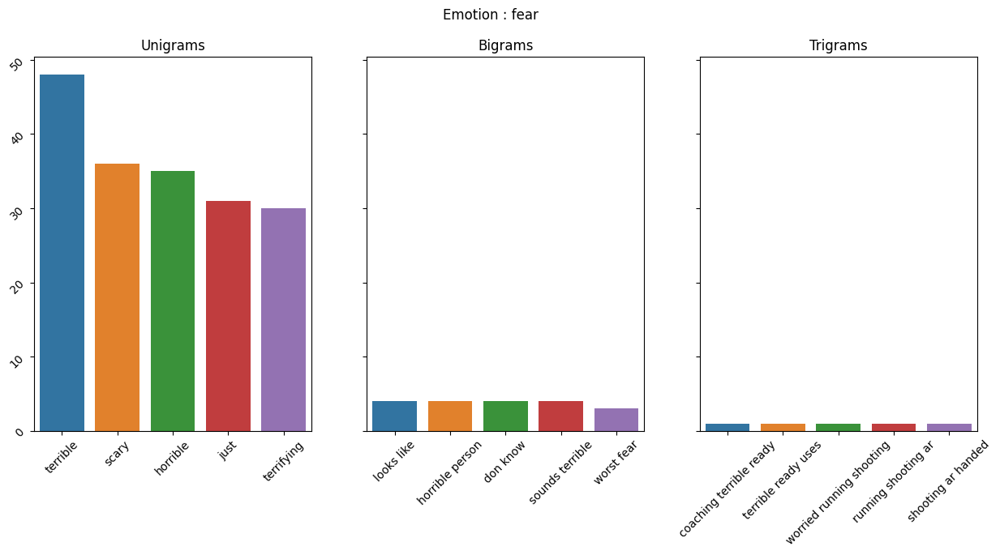

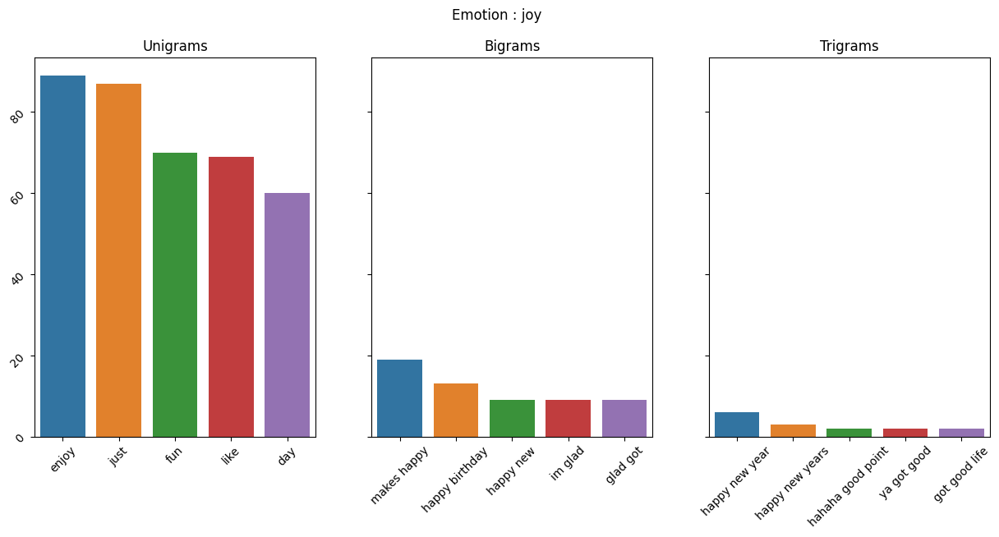

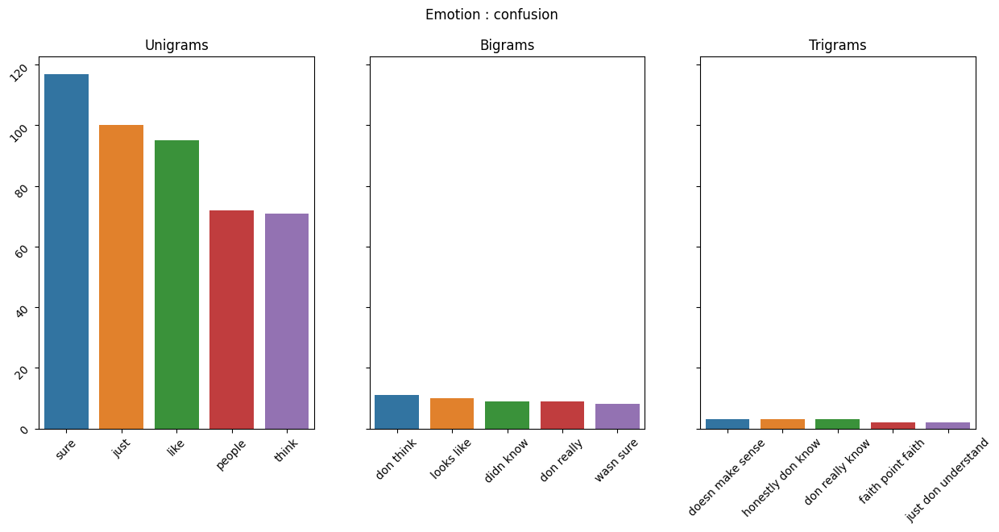

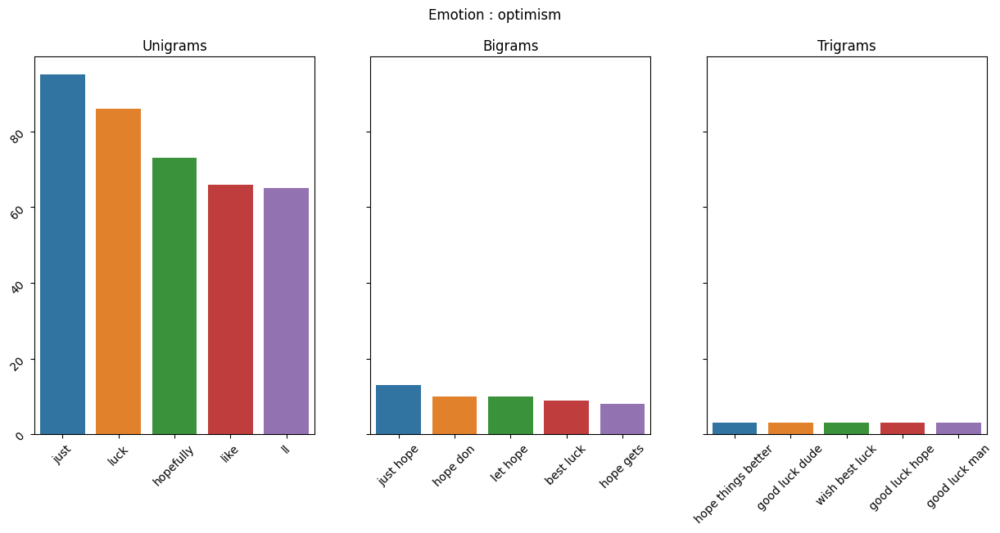

In [ ]:
for i in range(14):
  plot_ngram(emotion_df,grp_labels[i])

In [ ]:
df_exp1 = tokenize_self(df_exp1)
df_exp1 = df_exp1.drop(columns='text')

In [ ]:


import nltk
from nltk.util import ngrams

# Create a new column in the dataframe for storing the bigram tokens
df_exp1['bigram_tokens'] = ""

# Define the n-gram size
n = 2

# Create bigrams for each row in the dataframe
for index, row in df_exp1.iterrows():
    # Get the list of tokens for the current row
    tokens = row['tokens']
    # Create bigrams from the tokens
    bigrams = list(ngrams(tokens, n))
    # Add the bigram tokens to the dataframe
    df_exp1.at[index, 'bigram_tokens'] = bigrams

# Create a new column in the dataframe for storing the bigram tokens
df_exp1['trigram_tokens'] = ""

# Define the n-gram size
n = 3

# Create bigrams for each row in the dataframe
for index, row in df_exp1.iterrows():
    # Get the list of tokens for the current row
    tokens = row['tokens']
    # Create bigrams from the tokens
    bigrams = list(ngrams(tokens, n))
    # Add the bigram tokens to the dataframe
    df_exp1.at[index, 'trigram_tokens'] = bigrams

In [ ]:
df_exp1

,label,tokens,bigram_tokens,trigram_tokens
0,7,"[name, be, somany, favorite, hold, arm, name, ...","[(name, be), (be, somany), (somany, favorite),...","[(name, be, somany), (be, somany, favorite), (..."
1,6,"[m, curious, himym, affect, like, explain, wat...","[(m, curious), (curious, himym), (himym, affec...","[(m, curious, himym), (curious, himym, affect)..."
2,5,"[mom, say, ingrate, appreciate, sacrifice, mak...","[(mom, say), (say, ingrate), (ingrate, appreci...","[(mom, say, ingrate), (say, ingrate, appreciat..."
3,1,"[just, sad, so, so, sad]","[(just, sad), (sad, so), (so, so), (so, sad)]","[(just, sad, so), (sad, so, so), (so, so, sad)]"
4,6,"[report, think, s, stop, pme, start, follow, c...","[(report, think), (think, s), (s, stop), (stop...","[(report, think, s), (think, s, stop), (s, sto..."
...,...,...,...,...
25583,4,[fantastic],[],[]
25584,8,"[so, stupid, inherently, political, religion, ...","[(so, stupid), (stupid, inherently), (inherent...","[(so, stupid, inherently), (stupid, inherently..."
25585,4,"[choose, join, eec, policy, decision]","[(choose, join), (join, eec), (eec, policy), (...","[(choose, join, eec), (join, eec, policy), (ee..."
25586,6,"[completion, percentage, lose, half, get, garb...","[(completion, percentage), (percentage, lose),...","[(completion, percentage, lose), (percentage, ..."


bigram

Validation accuracy: 0.45722970039079464


Text(0.5, 1.0, 'Bigrams')

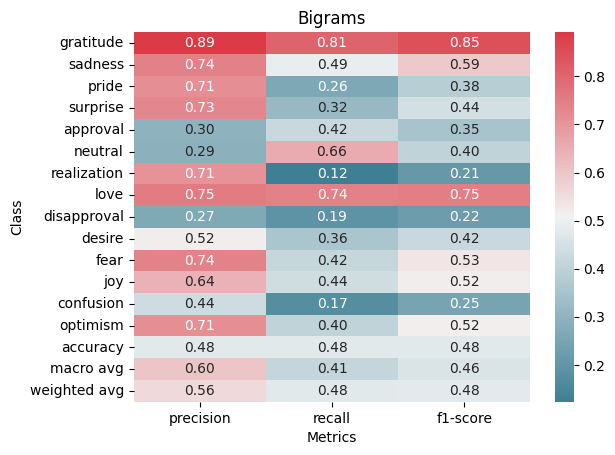

In [ ]:
train_df, test_df = train_test_split(df_exp1, test_size=0.1, random_state=42)
train_df, val_df = train_test_split(train_df, test_size=0.1, random_state=42)
# Initialize the vectorizer
vectorizer = TfidfVectorizer()
train_token = [' '.join(' '.join(t) for t in bigrams) for bigrams in train_df['bigram_tokens']]
# Fit the vectorizer to your tokenized data
vectorizer.fit(train_token)
# Transform the tokenized data into TF-IDF vectors
train_vectors = vectorizer.transform(train_token)
y_train = np.array(train_df['label'])
y_test = np.array(test_df['label'])
y_val = np.array(val_df['label'])

val_token = [' '.join(' '.join(t) for t in bigrams) for bigrams in val_df['bigram_tokens']]
# Transform the tokenized data into TF-IDF vectors
val_vectors = vectorizer.transform(val_token)
X_train = train_vectors

X_val = val_vectors
# Define your model architecture (SVM with radial basis function kernel)
model = SVC(kernel='rbf', C=1, gamma='scale', random_state=42)

# Train your model on the training set
model.fit(X_train, y_train)

# Evaluate your model on the validation set
accuracy = model.score(X_val, y_val)

print(f"Validation accuracy: {accuracy}")

test_token = [' '.join(' '.join(t) for t in bigrams) for bigrams in test_df['bigram_tokens']]
# Transform the tokenized data into TF-IDF vectors
test_vectors = vectorizer.transform(test_token)
X_test = test_vectors
# Make predictions on the validation set
y_pred = model.predict(X_test)

# Generate a classification report
report = classification_report(y_test, y_pred, target_names= grp_labels, output_dict=True)
df = pd.DataFrame(report).transpose()

# Remove the 'support' column from the DataFrame
df = df.drop('support', axis=1)

# Create a color map
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Create a color-coded heatmap of the classification report
sns.heatmap(df, cmap=cmap, annot=True, fmt='.2f')

# Set the axis labels and title
plt.xlabel('Metrics')
plt.ylabel('Class')
plt.title('Bigrams')

Text(0.5, 1.0, 'Bigrams')

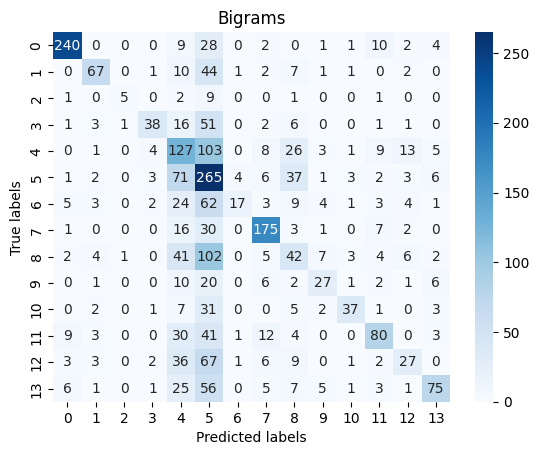

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
# Predict on test set
y_pred = model.predict(X_test)

# Get confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix as a heatmap
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')

# Set the axis labels and title
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Bigrams')

TRIGRAM

Validation accuracy: 0.3942683456361268


Text(0.5, 1.0, 'Trigrams')

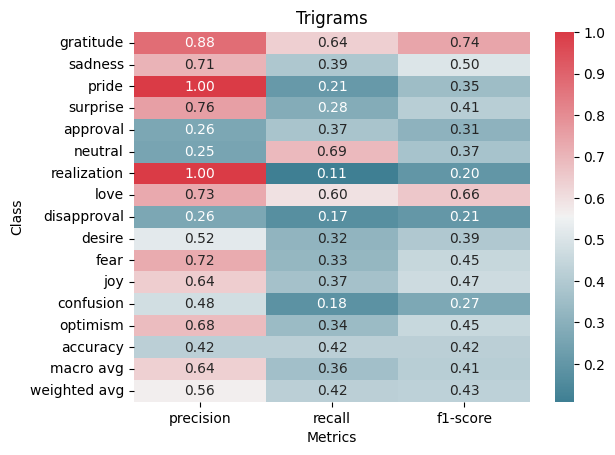

In [ ]:
train_df, test_df = train_test_split(df_exp1, test_size=0.1, random_state=42)
train_df, val_df = train_test_split(train_df, test_size=0.1, random_state=42)
# Initialize the vectorizer
vectorizer = TfidfVectorizer()
train_token = [' '.join(' '.join(t) for t in bigrams) for bigrams in train_df['trigram_tokens']]
# Fit the vectorizer to your tokenized data
vectorizer.fit(train_token)
# Transform the tokenized data into TF-IDF vectors
train_vectors = vectorizer.transform(train_token)
y_train = np.array(train_df['label'])
y_test = np.array(test_df['label'])
y_val = np.array(val_df['label'])

val_token = [' '.join(' '.join(t) for t in bigrams) for bigrams in val_df['trigram_tokens']]
# Transform the tokenized data into TF-IDF vectors
val_vectors = vectorizer.transform(val_token)
X_train = train_vectors

X_val = val_vectors
# Define your model architecture (SVM with radial basis function kernel)
model = SVC(kernel='rbf', C=1, gamma='scale', random_state=42)

# Train your model on the training set
model.fit(X_train, y_train)

# Evaluate your model on the validation set
accuracy = model.score(X_val, y_val)

print(f"Validation accuracy: {accuracy}")

test_token = [' '.join(' '.join(t) for t in bigrams) for bigrams in test_df['trigram_tokens']]
# Transform the tokenized data into TF-IDF vectors
test_vectors = vectorizer.transform(test_token)
X_test = test_vectors
# Make predictions on the validation set
y_pred = model.predict(X_test)

# Generate a classification report
report = classification_report(y_test, y_pred, target_names= grp_labels, output_dict=True)
df = pd.DataFrame(report).transpose()

# Remove the 'support' column from the DataFrame
df = df.drop('support', axis=1)

# Create a color map
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Create a color-coded heatmap of the classification report
sns.heatmap(df, cmap=cmap, annot=True, fmt='.2f')

# Set the axis labels and title
plt.xlabel('Metrics')
plt.ylabel('Class')
plt.title('Trigrams')

Text(0.5, 1.0, 'Trigrams')

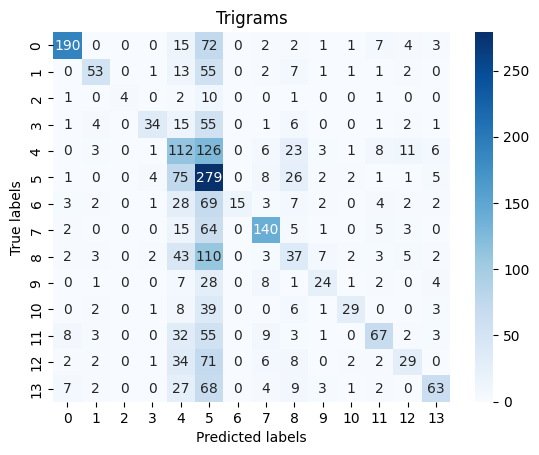

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
# Predict on test set
y_pred = model.predict(X_test)

# Get confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix as a heatmap
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')

# Set the axis labels and title
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Trigrams')

So we wont be using ngrams.

# EXPERIMENT 2 - NLP Architecture

We will be taking the best setup from exp 1 and try algorithms on it

## Variation - A (SVM CLASSIFIER)

In [ ]:
df_exp1 = dataframe_orig.copy()
def data_preprocess(df):
  # df = multiple_label_explode(df)
  df = hierarchical_label(df)
  df = remove_labels(df)
  df = order_grp_labels(df)
  df = remove_emoji(df)
  df = remove_unnecessary(df)
  df = remove_stopwords(df)
  df = stemm(df)
  # df = lemmatization(df)
  # df = spell_checker(df)
  df = normalization(df)
  return df
df_exp1 = data_preprocess(df_exp1)
count,df_exp1 = undersample(df_exp1, 3687) # cut down the number of samples to 3687
df_exp1 = shuffle(df_exp1, random_state=42)
df_exp1 = df_exp1.reset_index(drop=True)
df_exp1 = tokenize_self(df_exp1)
df_exp1 = df_exp1.drop(columns='text')


train_df, test_df = train_test_split(df_exp1, test_size=0.1, random_state=42)
train_df, val_df = train_test_split(train_df, test_size=0.1, random_state=42)

# Initialize the vectorizer
vectorizer = TfidfVectorizer()
train_token = [' '.join(tokens) for tokens in train_df['tokens']]
vectorizer.fit(train_token)
train_vectors = vectorizer.transform(train_token)
y_train = np.array(train_df['label'])
y_test = np.array(test_df['label'])
y_val = np.array(val_df['label'])
val_token = [' '.join(tokens) for tokens in val_df['tokens']]
val_vectors = vectorizer.transform(val_token)
X_train = train_vectors
X_val = val_vectors


model = SVC(kernel='rbf', C=1, gamma='scale', random_state=42)


model.fit(X_train, y_train)


accuracy = model.score(X_val, y_val)

print(f"Validation accuracy: {accuracy}")
test_token = [' '.join(tokens) for tokens in test_df['tokens']]

test_vectors = vectorizer.transform(test_token)# Transform the tokenized data into TF-IDF vectors
X_test = test_vectors

y_pred = model.predict(X_test)


report = classification_report(y_test, y_pred, target_names= grp_labels, output_dict=True)


The number of labels in each class is : Counter({5: 3687, 4: 3174, 0: 2982, 8: 2447, 7: 2335, 13: 1751, 11: 1704, 12: 1603, 1: 1558, 6: 1326, 3: 1315, 9: 800, 10: 764, 2: 142})
Validation accuracy: 0.5497177594442032


Text(0.5, 1.0, 'SVM')

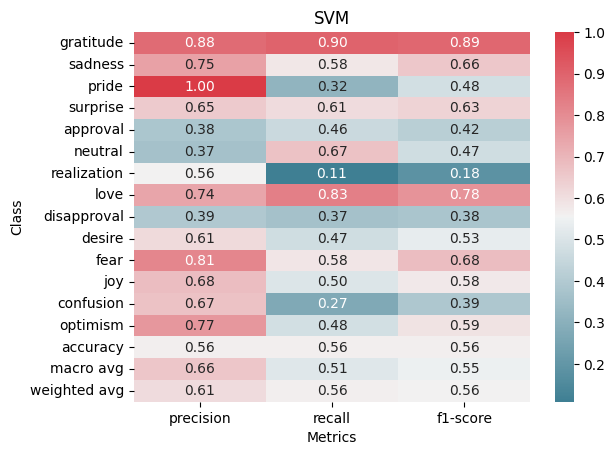

In [ ]:
df = pd.DataFrame(report).transpose()

# Remove the 'support' column from the DataFrame
df = df.drop('support', axis=1)

# Create a color map
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Create a color-coded heatmap of the classification report
sns.heatmap(df, cmap=cmap, annot=True, fmt='.2f')

# Set the axis labels and title
plt.xlabel('Metrics')
plt.ylabel('Class')
plt.title('SVM')

Text(0.5, 1.0, 'SVM')

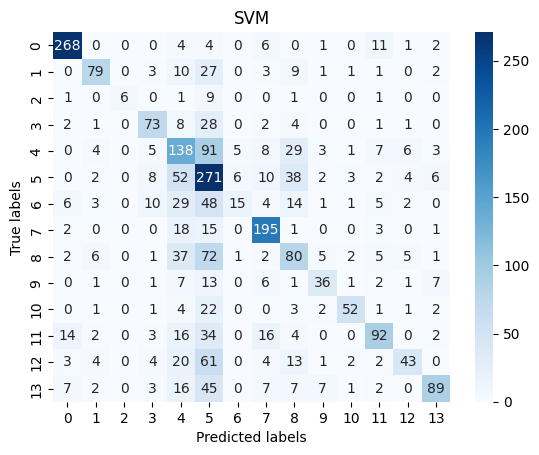

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
# Predict on test set
y_pred = model.predict(X_test)

# Get confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix as a heatmap
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')

# Set the axis labels and title
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('SVM')

## Variation - B (LSTM)

In [ ]:
def data_preprocess(df):
  df = multiple_label_explode(df)
  # df = hierarchical_label(df)
  df = remove_labels(df)
  df = order_grp_labels(df)
  df = remove_emoji(df)
  df = remove_unnecessary(df)
  # df = remove_stopwords(df)
  df = stemm(df)
  # df = lemmatization(df)
  # df = spell_checker(df)
  df = normalization(df)
  return df

In [ ]:
df_exp2 = dataframe_orig.copy()
df_exp2 = data_preprocess(df_exp2)
count,df_exp2 = undersample(df_exp2, 3687) # cut down the number of samples to 3687
df_exp2 = shuffle(df_exp2, random_state=42)
df_exp2 = df_exp2.reset_index(drop=True)
X_train, X_test, y_train, y_test = train_test_split(df_exp2['text'], df_exp2['label'], test_size=0.1, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=42)
# Convert labels to one-hot encoded representation
num_classes = 14
y_train = to_categorical(y_train, num_classes)
y_val = to_categorical(y_val, num_classes)
y_test = to_categorical(y_test, num_classes)

The number of labels in each class is : Counter({4: 3687, 5: 3687, 0: 3372, 8: 2581, 7: 2576, 13: 1976, 11: 1785, 12: 1673, 1: 1625, 6: 1382, 3: 1330, 9: 801, 10: 764, 2: 142})


In [ ]:
  # Tokenize the text data
  tokenizer = Tokenizer()#num_words=10000
  tokenizer.fit_on_texts(X_train)
  train_sequences = tokenizer.texts_to_sequences(X_train)
  val_sequences = tokenizer.texts_to_sequences(X_val)
  test_sequences = tokenizer.texts_to_sequences(X_test)

  # Pad the sequences to a fixed length
  maxlen = 30
  train_data = pad_sequences(train_sequences, maxlen=maxlen, padding = 'post', truncating='post')
  val_data = pad_sequences(val_sequences, maxlen=maxlen, padding = 'post', truncating='post')
  test_data = pad_sequences(test_sequences, maxlen=maxlen, padding = 'post', truncating='post')
  vocab_size = len(tokenizer.word_index) + 1

  print('Vocabulary size:', vocab_size)

Vocabulary size: 12929


In [ ]:
wordindex = tokenizer.word_index

In [ ]:
wordindex

{'i': 1,
 'the': 2,
 'to': 3,
 'it': 4,
 'a': 5,
 'you': 6,
 'that': 7,
 'and': 8,
 'is': 9,
 'name': 10,
 'thi': 11,
 'for': 12,
 'of': 13,
 'in': 14,
 'thank': 15,
 'be': 16,
 'my': 17,
 'love': 18,
 'wa': 19,
 'but': 20,
 'not': 21,
 'im': 22,
 'your': 23,
 'so': 24,
 'have': 25,
 'like': 26,
 'just': 27,
 'with': 28,
 'on': 29,
 'me': 30,
 'he': 31,
 'are': 32,
 'dont': 33,
 'they': 34,
 'what': 35,
 'if': 36,
 'get': 37,
 'do': 38,
 'as': 39,
 'at': 40,
 'hope': 41,
 'no': 42,
 'all': 43,
 'we': 44,
 'one': 45,
 'good': 46,
 'would': 47,
 'about': 48,
 'know': 49,
 'think': 50,
 'can': 51,
 'realli': 52,
 'make': 53,
 'there': 54,
 'how': 55,
 'go': 56,
 'peopl': 57,
 'out': 58,
 'up': 59,
 'will': 60,
 'time': 61,
 'too': 62,
 'she': 63,
 'more': 64,
 'from': 65,
 'or': 66,
 'now': 67,
 'when': 68,
 'see': 69,
 'an': 70,
 'look': 71,
 'thing': 72,
 'them': 73,
 'want': 74,
 'much': 75,
 'her': 76,
 'him': 77,
 'ha': 78,
 'feel': 79,
 'some': 80,
 'hi': 81,
 'year': 82,
 'well': 8

In [ ]:
max_len = max(len(sublist) for sublist in train_sequences)

print("The length of the longest list in the list is:", max_len)

The length of the longest list in the list is: 30


In [ ]:
print(train_sequences[0])
print(train_data[0])

[3400, 17, 1005]
[3400   17 1005    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0]


In [ ]:
def tf_processing(X_train, y_train, X_val,y_val, X_test,y_test,maxlen):
  # Tokenize the text data
  tokenizer = Tokenizer()#num_words=10000
  tokenizer.fit_on_texts(X_train)
  train_sequences = tokenizer.texts_to_sequences(X_train)
  val_sequences = tokenizer.texts_to_sequences(X_val)
  test_sequences = tokenizer.texts_to_sequences(X_test)

  # Pad the sequences to a fixed length
  maxlen = maxlen
  train_data = pad_sequences(train_sequences, maxlen=maxlen, padding = 'post', truncating='post')
  val_data = pad_sequences(val_sequences, maxlen=maxlen, padding = 'post', truncating='post')
  test_data = pad_sequences(test_sequences, maxlen=maxlen, padding = 'post', truncating='post')
  vocab_size = len(tokenizer.word_index) + 1

  print('Vocabulary size:', vocab_size)
  return train_data,val_data,test_data,maxlen

In [ ]:
train_data,val_data,test_data,maxlen = tf_processing(X_train, y_train, X_val,y_val, X_test,y_test,maxlen=32)

Vocabulary size: 12929


In [ ]:
# Define the LSTM model
model = Sequential()
model.add(Embedding(input_dim=12929, output_dim=128, input_length=maxlen))
model.add(LSTM(units=100, dropout=0.2, recurrent_dropout=0.2))
model.add(Dense(units=14, activation='softmax'))
# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
# Train the model
model.fit(train_data, y_train, validation_data=(val_data, y_val), epochs=30, batch_size=512)
# Evaluate the model
loss, accuracy = model.evaluate(test_data, y_test)
print('Test accuracy:', accuracy)

Epoch 1/30
44/44 [==============================] - 25s 373ms/step - loss: 2.5062 - accuracy: 0.1336 - val_loss: 2.4591 - val_accuracy: 0.1400
Epoch 2/30
44/44 [==============================] - 15s 336ms/step - loss: 2.3800 - accuracy: 0.1800 - val_loss: 2.2029 - val_accuracy: 0.2491
Epoch 3/30
44/44 [==============================] - 12s 272ms/step - loss: 2.0581 - accuracy: 0.2977 - val_loss: 2.0174 - val_accuracy: 0.3120
Epoch 4/30
44/44 [==============================] - 12s 263ms/step - loss: 1.8450 - accuracy: 0.3654 - val_loss: 1.8877 - val_accuracy: 0.3558
Epoch 5/30
44/44 [==============================] - 11s 244ms/step - loss: 1.6672 - accuracy: 0.4319 - val_loss: 1.8206 - val_accuracy: 0.4004
Epoch 6/30
44/44 [==============================] - 11s 260ms/step - loss: 1.5204 - accuracy: 0.4939 - val_loss: 1.7917 - val_accuracy: 0.4199
Epoch 7/30
44/44 [==============================] - 9s 218ms/step - loss: 1.4078 - accuracy: 0.5422 - val_loss: 1.8086 - val_accuracy: 0.4215


86/86 [==============================] - 2s 17ms/step


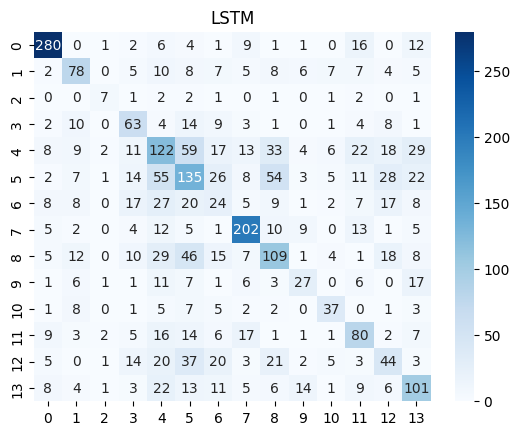

In [ ]:
# Predict the labels for the test data
y_pred = model.predict(test_data)
y_pred = np.argmax(y_pred, axis=1)
cm = confusion_matrix(np.argmax(y_test, axis=1), y_pred)

# Plot the confusion matrix as a heatmap
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues')
plt.title('LSTM')
plt.show()

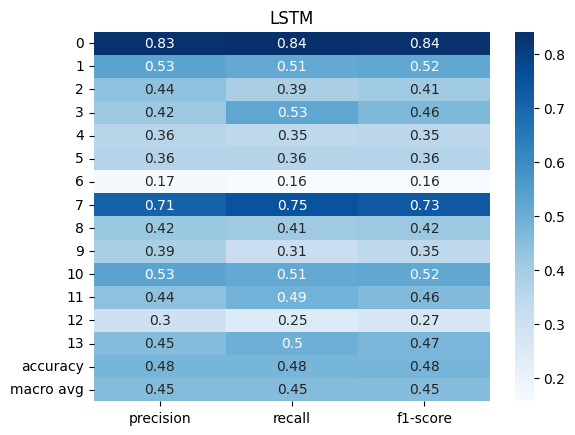

In [ ]:
# Generate the classification report
report = classification_report(np.argmax(y_test, axis=1), y_pred, output_dict=True)
df = pd.DataFrame(report).transpose()
df = df[:-1].transpose()
# Plot the classification report as a heatmap
sns.heatmap(df.iloc[:-1, :].T, annot=True, cmap='Blues')
plt.title('LSTM')
plt.show()

## Variation - C (BiDir-LSTM)

In [ ]:
# Define the LSTM model
model = Sequential()
model.add(Embedding(input_dim=12929, output_dim=128, input_length=maxlen))
model.add(Bidirectional(LSTM(units=100, dropout=0.2, activation= 'tanh', 
                             recurrent_activation='sigmoid',use_bias=True, 
                             recurrent_dropout=0, unroll=False, 
                             kernel_regularizer=regularizers.l2(0.01))))
model.add(Dense(units=14, activation='softmax'))
# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
# Train the model
model.fit(train_data, y_train, validation_data=(val_data, y_val), epochs=30, batch_size=512)
# Evaluate the model
loss, accuracy = model.evaluate(test_data, y_test)
print('Test accuracy:', accuracy)

Epoch 1/30
44/44 [==============================] - 13s 185ms/step - loss: 4.6958 - accuracy: 0.1355 - val_loss: 3.3818 - val_accuracy: 0.1525
Epoch 2/30
44/44 [==============================] - 5s 120ms/step - loss: 2.8134 - accuracy: 0.2132 - val_loss: 2.3252 - val_accuracy: 0.3022
Epoch 3/30
44/44 [==============================] - 4s 94ms/step - loss: 2.0492 - accuracy: 0.3596 - val_loss: 1.9518 - val_accuracy: 0.3765
Epoch 4/30
44/44 [==============================] - 5s 113ms/step - loss: 1.7076 - accuracy: 0.4507 - val_loss: 1.8415 - val_accuracy: 0.4292
Epoch 5/30
44/44 [==============================] - 2s 48ms/step - loss: 1.5345 - accuracy: 0.5196 - val_loss: 1.8759 - val_accuracy: 0.3984
Epoch 6/30
44/44 [==============================] - 2s 53ms/step - loss: 1.4115 - accuracy: 0.5650 - val_loss: 1.8399 - val_accuracy: 0.4467
Epoch 7/30
44/44 [==============================] - 2s 42ms/step - loss: 1.2761 - accuracy: 0.6205 - val_loss: 1.8585 - val_accuracy: 0.4475
Epoch 8/3

86/86 [==============================] - 1s 5ms/step


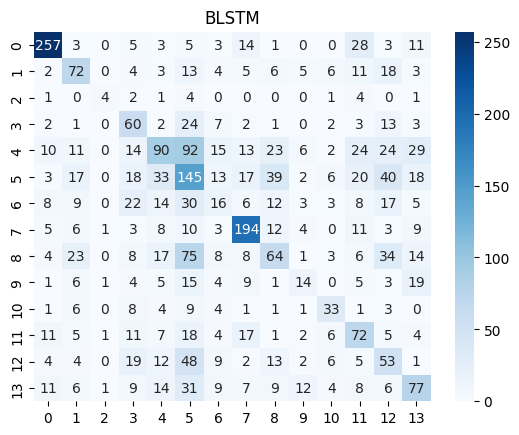

In [ ]:
# Predict the labels for the test data
y_pred = model.predict(test_data)
y_pred = np.argmax(y_pred, axis=1)
cm = confusion_matrix(np.argmax(y_test, axis=1), y_pred)

# Plot the confusion matrix as a heatmap
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues')
plt.title('BLSTM')
plt.show()

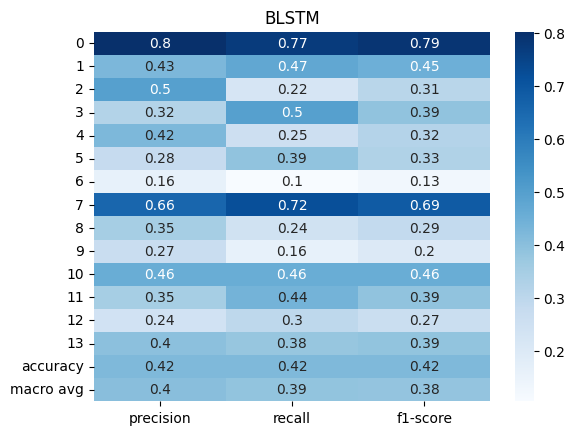

In [ ]:
# Generate the classification report
report = classification_report(np.argmax(y_test, axis=1), y_pred, output_dict=True)
df = pd.DataFrame(report).transpose()
df = df[:-1].transpose()
# Plot the classification report as a heatmap
sns.heatmap(df.iloc[:-1, :].T, annot=True, cmap='Blues')
plt.title('BLSTM')
plt.show()

# EXPERIMENT 3 - Text Featurization

In [ ]:
def data_preprocess(df):
  df = multiple_label_explode(df)
  # df = hierarchical_label(df)
  df = remove_labels(df)
  df = order_grp_labels(df)
  df = remove_emoji(df)
  df = remove_unnecessary(df)
  df = remove_stopwords(df)
  # df = stemm(df)
  # df = lemmatization(df)
  # df = spell_checker(df)
  df = normalization(df)
  return df

In [ ]:
df_exp3 = dataframe_orig.copy()
df_exp3 = data_preprocess(df_exp3)
count,df_exp1 = undersample(df_exp3, 3687) # cut down the number of samples to 3687
df_exp3 = shuffle(df_exp3, random_state=42)
df_exp3 = df_exp3.reset_index(drop=True)

X_train, X_test, y_train, y_test = train_test_split(df_exp3['text'], df_exp3['label'], test_size=0.1, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=42)

The number of labels in each class is : Counter({4: 3687, 5: 3687, 0: 3372, 8: 2581, 7: 2576, 13: 1976, 11: 1785, 12: 1673, 1: 1625, 6: 1382, 3: 1330, 9: 801, 10: 764, 2: 142})


## Variation - A (using tfidf instead of embedding layer)

In [ ]:
df_exp3['label'] = df_exp3['label'].apply(lambda x: x[0] if isinstance(x, list) else x).astype(int)
X_train, X_test, y_train, y_test = train_test_split(df_exp3['text'], df_exp3['label'], test_size=0.1, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=42)

In [ ]:
# Convert texts to tf-idf features
vectorizer = TfidfVectorizer(max_features=12732)
train_data = csr_matrix(vectorizer.fit_transform(X_train)).toarray()
val_data = csr_matrix(vectorizer.transform(X_val)).toarray()
test_data = csr_matrix(vectorizer.transform(X_test)).toarray()

# Reshape the data to add a third dimension
train_data = train_data.reshape(train_data.shape[0], 1, train_data.shape[1])
val_data = val_data.reshape(val_data.shape[0], 1, val_data.shape[1])
test_data = test_data.reshape(test_data.shape[0], 1, test_data.shape[1])

# Define the model
model = Sequential()
model.add(Bidirectional(LSTM(units=100, dropout=0.2, activation= 'tanh', recurrent_activation='sigmoid',use_bias=True, recurrent_dropout=0, unroll=False, kernel_regularizer=regularizers.l2(0.01))))
model.add(Dense(units=14, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(train_data, y_train, validation_data=(val_data, y_val), epochs=30, batch_size=128)

# Evaluate the model
loss, accuracy = model.evaluate(test_data, y_test)
print('Test accuracy:', accuracy)

Epoch 1/30
263/263 [==============================] - 12s 20ms/step - loss: 2.5906 - accuracy: 0.4258 - val_loss: 2.0693 - val_accuracy: 0.4277
Epoch 2/30
263/263 [==============================] - 4s 15ms/step - loss: 2.0656 - accuracy: 0.4283 - val_loss: 2.0624 - val_accuracy: 0.4277
Epoch 3/30
263/263 [==============================] - 4s 17ms/step - loss: 2.0579 - accuracy: 0.4294 - val_loss: 2.0523 - val_accuracy: 0.4290
Epoch 4/30
263/263 [==============================] - 4s 15ms/step - loss: 2.0389 - accuracy: 0.4398 - val_loss: 2.0252 - val_accuracy: 0.4507
Epoch 5/30
263/263 [==============================] - 4s 14ms/step - loss: 2.0082 - accuracy: 0.4647 - val_loss: 1.9887 - val_accuracy: 0.4802
Epoch 6/30
263/263 [==============================] - 4s 15ms/step - loss: 1.9743 - accuracy: 0.4882 - val_loss: 1.9515 - val_accuracy: 0.5019
Epoch 7/30
263/263 [==============================] - 4s 17ms/step - loss: 1.9490 - accuracy: 0.5006 - val_loss: 1.9225 - val_accuracy: 0.511

130/130 [==============================] - 1s 4ms/step


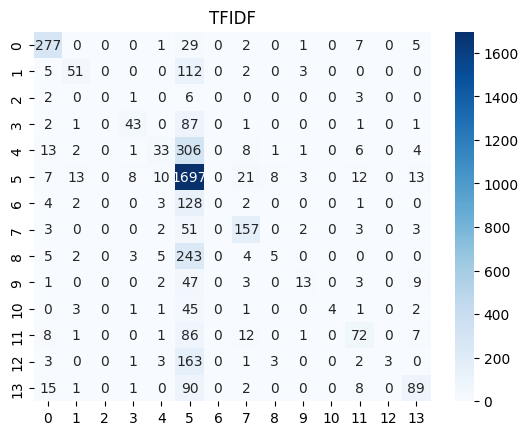

In [ ]:
# Predict the labels for the test data
y_pred = model.predict(test_data)
y_pred = np.argmax(y_pred, axis = 1)
y_true = np.array(y_test)
cm = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix as a heatmap
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues')
plt.title('TFIDF')
plt.show()

/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



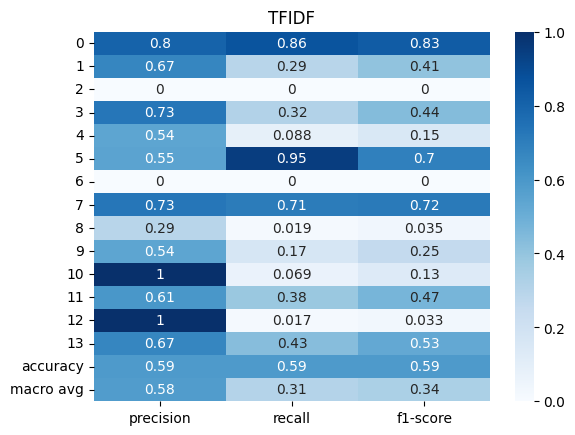

In [ ]:
# Generate the classification report
report = classification_report(y_true, y_pred, output_dict=True)
df = pd.DataFrame(report).transpose()
df = df[:-1].transpose()
# Plot the classification report as a heatmap
sns.heatmap(df.iloc[:-1, :].T, annot=True, cmap='Blues')
plt.title('TFIDF')
plt.show()

## Variation - B (using GloVe embedding in embedding layer as pretrained embedding)

use this link to download the ‘glove.twitter.27B.100d.txt’ https://drive.google.com/file/d/1JULuQLe6m2MSGjBge_0higN-_4ZWrzB1/view?usp=share_link to use in the glove embedding
alternatively this can be also used- https://nlp.stanford.edu/data/glove.twitter.27B.zip

In [ ]:
def create_corpus_tk(df):
  corpus = []
  for text in df['text']:
    words = [word.lower() for word in word_tokenize(text)]
    corpus.append(words)
  return corpus

In [ ]:
corpus = create_corpus_tk(df_exp3)
num_words = len(corpus)
print(num_words)

41466


In [ ]:
corpus[0]

['op', 'nt', 'follow', 'simplest', 'rules', 'reddit']

In [ ]:
df_exp3['label'] = df_exp3['label'].apply(lambda x: x[0] if isinstance(x, list) else x).astype(int)
X_train, X_test, y_train, y_test = train_test_split(df_exp3['text'], df_exp3['label'], test_size=0.1, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=42)
X_train, X_test, y_train, y_test = train_test_split(df_exp3['text'], df_exp3['label'], test_size=0.1, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=42)

In [ ]:

# Tokenize the text data
tokenizer = Tokenizer(num_words=num_words)#num_words=10000
tokenizer.fit_on_texts(X_train)
train_sequences = tokenizer.texts_to_sequences(X_train)
val_sequences = tokenizer.texts_to_sequences(X_val)
test_sequences = tokenizer.texts_to_sequences(X_test)

# Pad the sequences to a fixed length
maxlen = 30
train_data = pad_sequences(train_sequences, maxlen=maxlen, padding = 'post', truncating='post')
val_data = pad_sequences(val_sequences, maxlen=maxlen, padding = 'post', truncating='post')
test_data = pad_sequences(test_sequences, maxlen=maxlen, padding = 'post', truncating='post')
vocab_size = len(tokenizer.word_index) + 1

print('Vocabulary size:', vocab_size)

Vocabulary size: 23495


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**use the ‘glove.twitter.27B.100d.txt’ file**

In [ ]:
embedding_dict = {}
with open('/content/drive/MyDrive/NLP/glove.twitter.27B/glove.twitter.27B.100d.txt', 'r', encoding='utf-8') as f:
    for line in f:
        values = line.split()
        word = values[0]
        vectors = np.asarray(values[1:], 'float32')
        embedding_dict[word] = vectors

In [ ]:
word_index = tokenizer.word_index

In [ ]:
num_words = len(word_index) + 1
embedding_matrix = np.zeros((num_words, 100))

for word,i in word_index.items():
  if i<num_words:
    emb_vec = embedding_dict.get(word)
    if emb_vec is not None:
      embedding_matrix[i] = emb_vec
    

In [ ]:
embedding_matrix

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.073381  ,  0.81691998, -0.41271999, ...,  0.35069001,
        -0.26436999, -0.31174001],
       [ 0.53169   , -0.19245   , -0.58433998, ..., -0.22885001,
        -0.14353999, -0.3098    ],
       ...,
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.055527  , -0.62957001,  0.38589999, ..., -0.62023002,
         0.22125   ,  0.038953  ],
       [ 0.14413001,  0.27373001, -0.77328998, ...,  0.84943002,
         0.25720999,  0.78593999]])

In [ ]:

# Define the LSTM model
model = Sequential()
model.add(Embedding(input_dim=num_words, output_dim=100, input_length=maxlen, embeddings_initializer = Constant(embedding_matrix), trainable = False))
model.add(Bidirectional(LSTM(units=100, dropout=0.2, activation= 'tanh', recurrent_activation='sigmoid',use_bias=True, recurrent_dropout=0, unroll=False, kernel_regularizer=regularizers.l2(0.01))))
model.add(Dense(units=14, activation='softmax'))
# Compile the model

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
# Train the model
history = model.fit(train_data, y_train, validation_data=(val_data, y_val), epochs=30, verbose=1, batch_size=128)
# Evaluate the model
loss, accuracy = model.evaluate(test_data, y_test)
print('Test accuracy:', accuracy)

Epoch 1/30
263/263 [==============================] - 7s 12ms/step - loss: 2.2102 - accuracy: 0.5040 - val_loss: 1.6043 - val_accuracy: 0.5490
Epoch 2/30
263/263 [==============================] - 2s 9ms/step - loss: 1.5710 - accuracy: 0.5612 - val_loss: 1.5130 - val_accuracy: 0.5718
Epoch 3/30
263/263 [==============================] - 3s 12ms/step - loss: 1.5252 - accuracy: 0.5732 - val_loss: 1.4771 - val_accuracy: 0.5924
Epoch 4/30
263/263 [==============================] - 2s 9ms/step - loss: 1.4993 - accuracy: 0.5778 - val_loss: 1.4536 - val_accuracy: 0.5874
Epoch 5/30
263/263 [==============================] - 2s 8ms/step - loss: 1.4786 - accuracy: 0.5848 - val_loss: 1.4566 - val_accuracy: 0.5874
Epoch 6/30
263/263 [==============================] - 2s 8ms/step - loss: 1.4664 - accuracy: 0.5865 - val_loss: 1.4439 - val_accuracy: 0.5924
Epoch 7/30
263/263 [==============================] - 2s 8ms/step - loss: 1.4518 - accuracy: 0.5894 - val_loss: 1.4329 - val_accuracy: 0.5978
Epoc

130/130 [==============================] - 1s 3ms/step


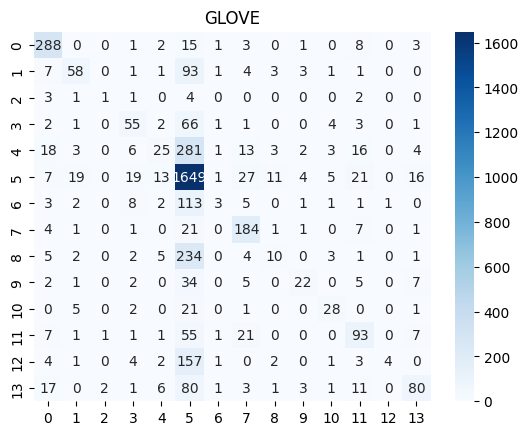

In [ ]:
# Predict the labels for the test data
y_pred = model.predict(test_data)
y_pred = np.argmax(y_pred, axis = 1)
y_true = np.array(y_test)
cm = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix as a heatmap
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues')
plt.title('GLOVE')
plt.show()

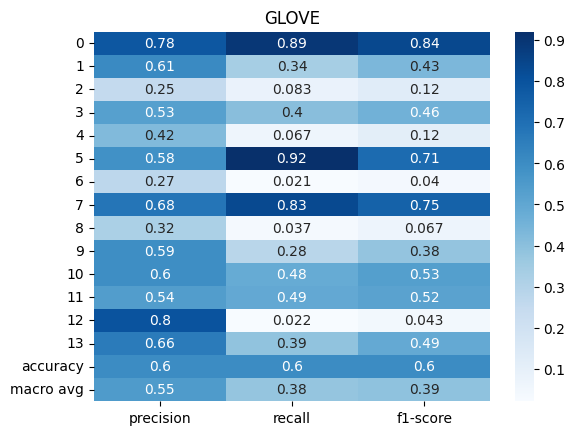

In [ ]:
# Generate the classification report
report = classification_report(y_true, y_pred, output_dict=True)
df = pd.DataFrame(report).transpose()
df = df[:-1].transpose()
# Plot the classification report as a heatmap
sns.heatmap(df.iloc[:-1, :].T, annot=True, cmap='Blues')
plt.title('GLOVE')
plt.show()

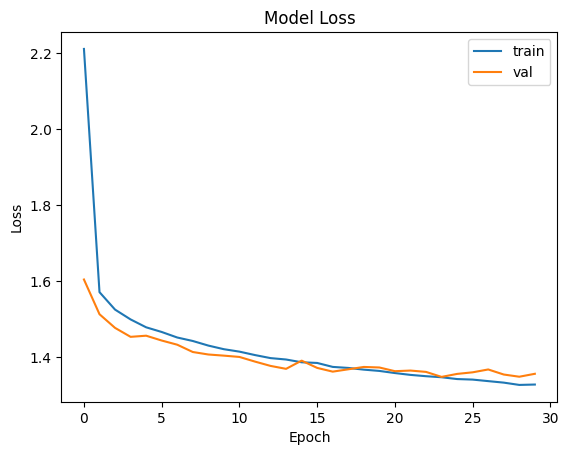

In [ ]:
# Plot the training and validation loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'val'], loc='upper right')
plt.show()


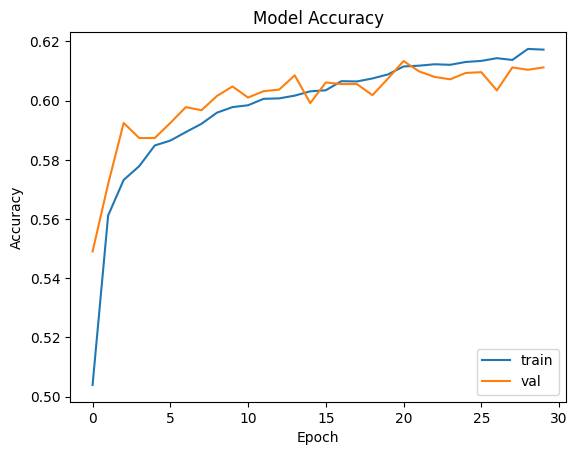

In [ ]:
# Plot the training and validation accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'val'], loc='lower right')
plt.show()

# EXPERIMENT 4 - Hyperparameter Optimization

## The Previous BLSTM model but 100 epoch and batch_size 32

In [ ]:
# Define the LSTM model
model = Sequential()
model.add(Embedding(input_dim=num_words, output_dim=100, input_length=maxlen, embeddings_initializer = Constant(embedding_matrix), trainable = False))
model.add(Bidirectional(LSTM(units=100, dropout=0.2, activation= 'tanh', recurrent_activation='sigmoid',use_bias=True, recurrent_dropout=0, unroll=False, kernel_regularizer=regularizers.l2(0.01))))
model.add(Dense(units=14, activation='softmax'))
# Compile the model

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
# Train the model
history = model.fit(train_data, y_train, validation_data=(val_data, y_val), epochs=100, verbose=1, batch_size=32)
# Evaluate the model
loss, accuracy = model.evaluate(test_data, y_test)
print('Test accuracy:', accuracy)

Epoch 1/100
1050/1050 [==============================] - 15s 9ms/step - loss: 1.8095 - accuracy: 0.5362 - val_loss: 1.5323 - val_accuracy: 0.5721
Epoch 2/100
1050/1050 [==============================] - 9s 9ms/step - loss: 1.5409 - accuracy: 0.5751 - val_loss: 1.4692 - val_accuracy: 0.5825
Epoch 3/100
1050/1050 [==============================] - 9s 9ms/step - loss: 1.5001 - accuracy: 0.5833 - val_loss: 1.4664 - val_accuracy: 0.5967
Epoch 4/100
1050/1050 [==============================] - 8s 8ms/step - loss: 1.4725 - accuracy: 0.5899 - val_loss: 1.4497 - val_accuracy: 0.5927
Epoch 5/100
1050/1050 [==============================] - 9s 9ms/step - loss: 1.4511 - accuracy: 0.5947 - val_loss: 1.4296 - val_accuracy: 0.5975
Epoch 6/100
1050/1050 [==============================] - 9s 9ms/step - loss: 1.4357 - accuracy: 0.5972 - val_loss: 1.4187 - val_accuracy: 0.6034
Epoch 7/100
1050/1050 [==============================] - 8s 8ms/step - loss: 1.4241 - accuracy: 0.6005 - val_loss: 1.4062 - val_a

130/130 [==============================] - 2s 4ms/step


<Axes: >

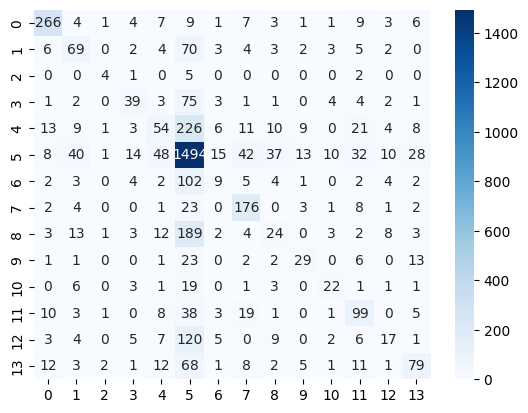

In [ ]:
# Predict the labels for the test data
y_pred = model.predict(test_data)
y_pred = np.argmax(y_pred, axis = 1)
y_true = np.array(y_test)
cm = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix as a heatmap
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues')

<Axes: >

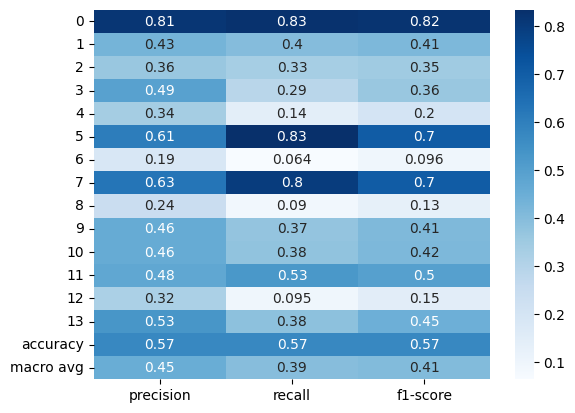

In [ ]:
# Generate the classification report
report = classification_report(y_true, y_pred, output_dict=True)
df = pd.DataFrame(report).transpose()
df = df[:-1].transpose()
# Plot the classification report as a heatmap
sns.heatmap(df.iloc[:-1, :].T, annot=True, cmap='Blues')

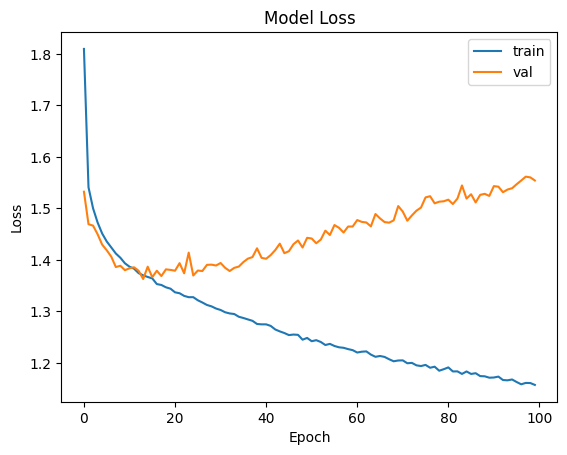

In [ ]:
# Plot the training and validation loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'val'], loc='upper right')
plt.show()


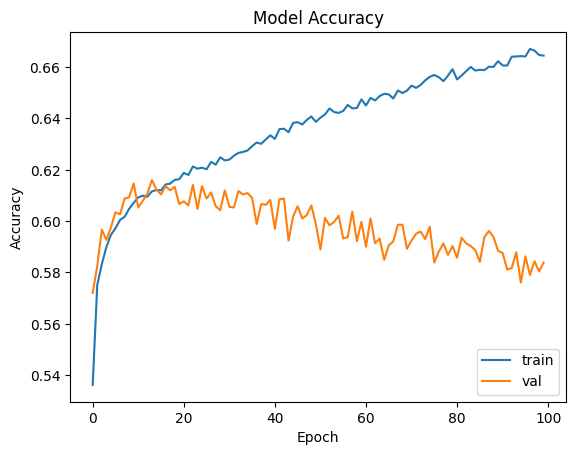

In [ ]:
# Plot the training and validation accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'val'], loc='lower right')
plt.show()

## Variation - B (Learning rate and dropoutlayer)

In [ ]:
# Define the LSTM model
model = Sequential()
model.add(Embedding(input_dim=num_words, output_dim=100, input_length=maxlen, embeddings_initializer = Constant(embedding_matrix), trainable = False))
model.add(Bidirectional(LSTM(units=100, dropout=0.2, activation= 'tanh', recurrent_activation='sigmoid',use_bias=True, recurrent_dropout=0, unroll=False, kernel_regularizer=regularizers.l2(0.04))))
model.add(Dropout(0.3))
model.add(Dense(units=14, activation='softmax'))
optimizer = Adam(learning_rate = 3e-4)
# Compile the model
model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])


# Train the model
history = model.fit(train_data, y_train, validation_data=(val_data, y_val), epochs=100, verbose=1, batch_size=32)

# Evaluate the model
loss, accuracy = model.evaluate(test_data, y_test)
print('Test accuracy:', accuracy)

Epoch 1/100
1050/1050 [==============================] - 13s 9ms/step - loss: 3.2842 - accuracy: 0.4803 - val_loss: 1.7265 - val_accuracy: 0.5238
Epoch 2/100
1050/1050 [==============================] - 8s 7ms/step - loss: 1.7199 - accuracy: 0.5251 - val_loss: 1.6587 - val_accuracy: 0.5332
Epoch 3/100
1050/1050 [==============================] - 10s 9ms/step - loss: 1.6683 - accuracy: 0.5350 - val_loss: 1.6230 - val_accuracy: 0.5450
Epoch 4/100
1050/1050 [==============================] - 8s 8ms/step - loss: 1.6369 - accuracy: 0.5421 - val_loss: 1.5909 - val_accuracy: 0.5453
Epoch 5/100
1050/1050 [==============================] - 8s 8ms/step - loss: 1.6112 - accuracy: 0.5470 - val_loss: 1.5779 - val_accuracy: 0.5493
Epoch 6/100
1050/1050 [==============================] - 9s 9ms/step - loss: 1.5950 - accuracy: 0.5530 - val_loss: 1.5573 - val_accuracy: 0.5614
Epoch 7/100
1050/1050 [==============================] - 8s 7ms/step - loss: 1.5770 - accuracy: 0.5556 - val_loss: 1.5304 - val_

130/130 [==============================] - 1s 3ms/step


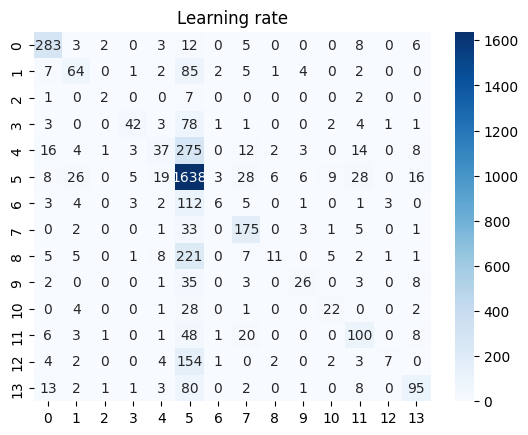

In [ ]:
# Predict the labels for the test data
y_pred = model.predict(test_data)
y_pred = np.argmax(y_pred, axis = 1)
y_true = np.array(y_test)
cm = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix as a heatmap
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues')
plt.title('Learning rate')
plt.show()

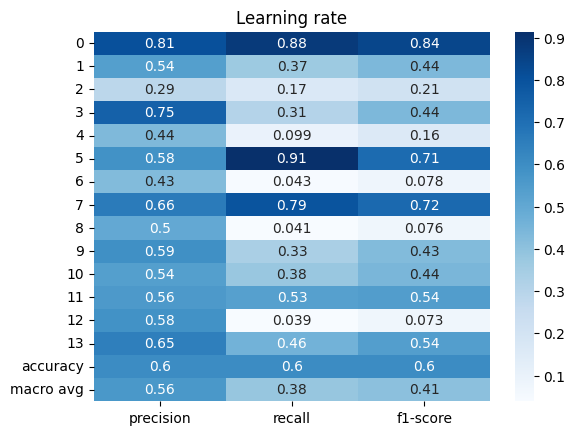

In [ ]:
# Generate the classification report
report = classification_report(y_true, y_pred, output_dict=True)
df = pd.DataFrame(report).transpose()
df = df[:-1].transpose()
# Plot the classification report as a heatmap
sns.heatmap(df.iloc[:-1, :].T, annot=True, cmap='Blues')
plt.title('Learning rate')
plt.show()

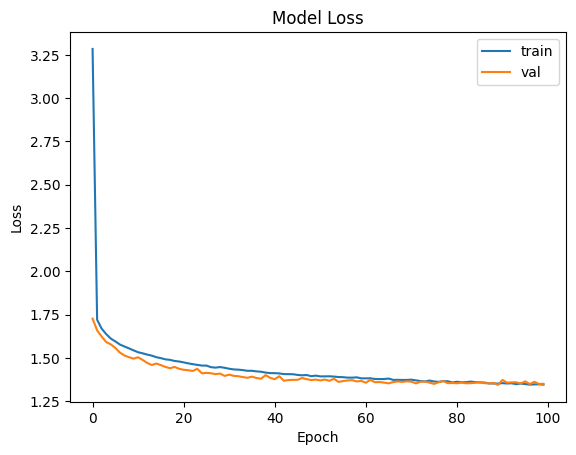

In [ ]:
# Plot the training and validation loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'val'], loc='upper right')
plt.show()


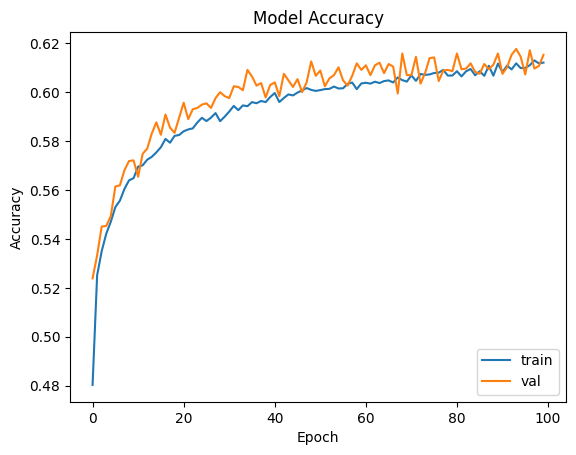

In [ ]:
# Plot the training and validation accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'val'], loc='lower right')
plt.show()

## Variation - C (implementation of CNN on BLSTM) (Implementing Early stopping)

In [ ]:
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Reshape, Concatenate, Flatten
from tensorflow.keras.callbacks import TensorBoard
tensorboard_callback = TensorBoard(log_dir="./logs")
model = Sequential()

model.add(Embedding(input_dim=num_words, output_dim=100, input_length=maxlen, 
                    embeddings_initializer=Constant(embedding_matrix), trainable=False))

model.add(Bidirectional(LSTM(units=100, dropout=0.2, activation='tanh', 
                             recurrent_activation='sigmoid', use_bias=True, 
                             recurrent_dropout=0, unroll=False, 
                             kernel_regularizer=regularizers.l2(0.01), return_sequences=True)))

# Add convolution layers
model.add(Reshape((-1, 100, 1)))   # reshape output of BLSTM layer to 3D tensor
model.add(Conv2D(filters=100, kernel_size=(3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dropout(0.2))
model.add(Dense(units=14, activation='softmax'))

optimizer = Adam(learning_rate=3e-4)
model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

early_stop = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

# Train the model
history = model.fit(train_data, y_train, validation_data=(val_data, y_val), epochs=50, verbose=1,
                    batch_size = 16, callbacks=[early_stop, tensorboard_callback])

# Evaluate the model
loss, accuracy = model.evaluate(test_data, y_test)
print('Test accuracy:', accuracy)

Epoch 1/50
2100/2100 [==============================] - 34s 12ms/step - loss: 1.9332 - accuracy: 0.5093 - val_loss: 1.5623 - val_accuracy: 0.5544
Epoch 2/50
2100/2100 [==============================] - 24s 11ms/step - loss: 1.5533 - accuracy: 0.5542 - val_loss: 1.4727 - val_accuracy: 0.5729
Epoch 3/50
2100/2100 [==============================] - 24s 11ms/step - loss: 1.4847 - accuracy: 0.5750 - val_loss: 1.4211 - val_accuracy: 0.5994
Epoch 4/50
2100/2100 [==============================] - 27s 13ms/step - loss: 1.4311 - accuracy: 0.5919 - val_loss: 1.3949 - val_accuracy: 0.5981
Epoch 5/50
2100/2100 [==============================] - 23s 11ms/step - loss: 1.3941 - accuracy: 0.6009 - val_loss: 1.3682 - val_accuracy: 0.6029
Epoch 6/50
2100/2100 [==============================] - 24s 11ms/step - loss: 1.3653 - accuracy: 0.6098 - val_loss: 1.3584 - val_accuracy: 0.6093
Epoch 7/50
2100/2100 [==============================] - 24s 11ms/step - loss: 1.3495 - accuracy: 0.6101 - val_loss: 1.3383 -

130/130 [==============================] - 1s 4ms/step


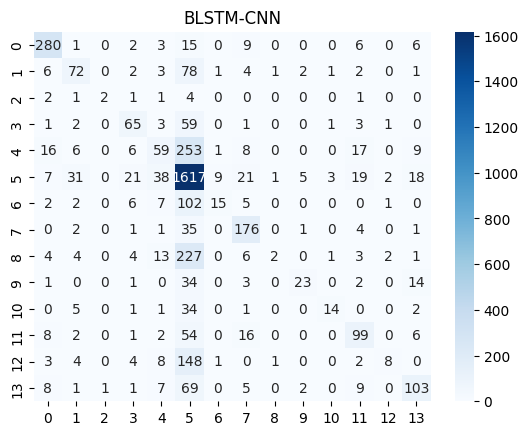

In [ ]:
# Predict the labels for the test data
y_pred = model.predict(test_data)
y_pred = np.argmax(y_pred, axis = 1)
y_true = np.array(y_test)
cm = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix as a heatmap
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues')
plt.title('BLSTM-CNN')
plt.show()

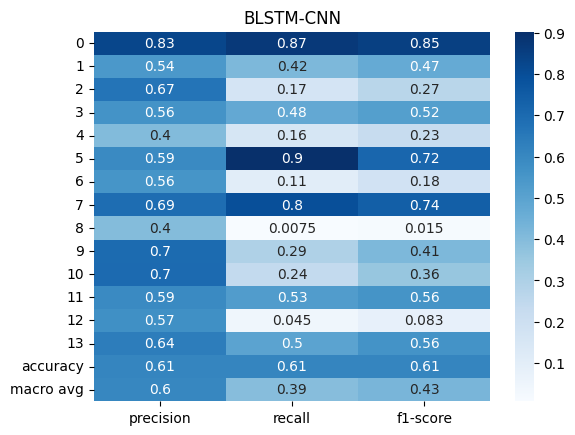

In [ ]:
# Generate the classification report
report = classification_report(y_true, y_pred, output_dict=True)
df = pd.DataFrame(report).transpose()
df = df[:-1].transpose()
# Plot the classification report as a heatmap
sns.heatmap(df.iloc[:-1, :].T, annot=True, cmap='Blues')
plt.title('BLSTM-CNN')
plt.show()

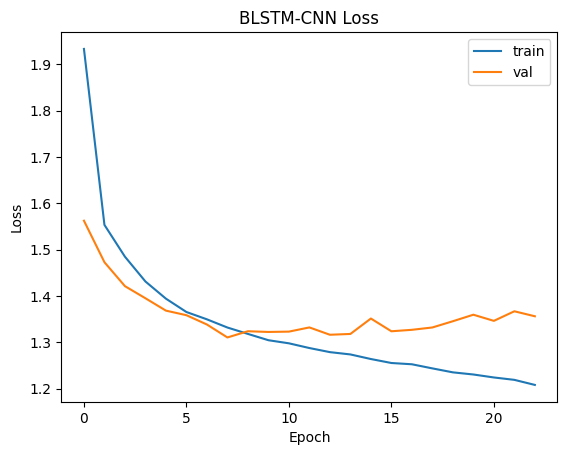

In [ ]:
# Plot the training and validation loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('BLSTM-CNN Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'val'], loc='upper right')
plt.show()


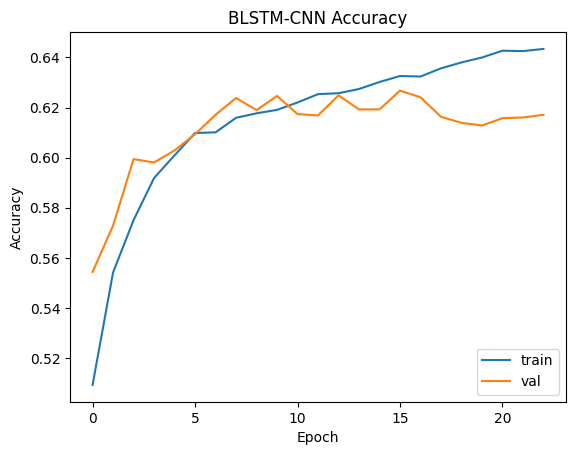

In [ ]:
# Plot the training and validation accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('BLSTM-CNN Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'val'], loc='lower right')
plt.show()

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=./logs

<IPython.core.display.Javascript object>